In [32]:
import pandas as pd
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_error

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, LSTM, Dense, Input
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.metrics import CategoricalAccuracy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

In [33]:
df_merged = pd.read_csv('master_merged_adjusted.csv')
print(df_merged.shape)
df_merged.head()

(15549, 16)


,YEAR,MONTH,CASERNE,INCIDENT_COUNT,RISK_LEVEL,MONTH_SIN,MONTH_COS,LAG1_RISK_LEVEL,LAG1_INCIDENT_COUNT,TEMPERATURE_MAX,CRIME_COUNT,TOTAL_BUILDING_AREA,TOTAL_BUILDINGS,RESIDENTIAL,PUBLIC_SERVICES,AVG_FLOORS
0,2005,2,3,1.0,Low,8.660254e-01,5.000000e-01,Low,0.0,3.6,1645.0,1233617.0,10148.0,8572.0,4.0,1.100186
1,2005,3,3,3.0,Low,1.000000e+00,6.123234e-17,Low,1.0,13.4,1645.0,1233617.0,10148.0,8572.0,4.0,1.100186
2,2005,4,3,3.0,Low,8.660254e-01,-5.000000e-01,Low,3.0,20.1,1645.0,1233617.0,10148.0,8572.0,4.0,1.100186
3,2005,5,3,1.0,Low,5.000000e-01,-8.660254e-01,Low,3.0,23.1,1645.0,1233617.0,10148.0,8572.0,4.0,1.100186
4,2005,6,3,2.0,Low,1.224647e-16,-1.000000e+00,Low,1.0,30.5,1645.0,1233617.0,10148.0,8572.0,4.0,1.100186


In [34]:
df_merged['CASERNE'].unique()

array([ 3,  4,  5,  8,  9, 10, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23,
       25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 37, 38, 39, 40, 41, 42,
       43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59,
       61, 62, 63, 64, 65, 66, 67, 71, 72, 73, 74, 75, 76, 77, 78])

In [35]:
dict_casernes = {}

for cas_no in df_merged['CASERNE'].unique():
  # Put each set of caserne data into its own data frame
  dict_casernes[cas_no] = df_merged[df_merged['CASERNE'] == cas_no].reset_index(drop=True).sort_values(by=['YEAR', 'MONTH'], ascending=[True, True])

In [36]:
def create_categorical_model(input_shape):
  model = Sequential()
  model.add(Input(shape=input_shape))
  model.add(SimpleRNN(24, activation='tanh', return_sequences=True))
  model.add(SimpleRNN(24, activation='tanh'))
  model.add(Dense(3, activation='softmax'))
  model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=[CategoricalAccuracy()])
  return model

In [37]:
np.random.seed(42)
tf.random.set_seed(42)

models = {}
history = {}
results = {}

label_encoder = LabelEncoder()
label_encoder.fit(df_merged['RISK_LEVEL'].values)

for cas_no in dict_casernes.keys():
  scaler = MinMaxScaler()
  X = dict_casernes[cas_no][[
    'YEAR',
    'MONTH_SIN',
    'MONTH_COS',
    'LAG1_INCIDENT_COUNT',
    'TEMPERATURE_MAX'
  ]]
  y = dict_casernes[cas_no]['RISK_LEVEL'].values

  #previous_level_encoded = label_encoder.transform(X['LAG1_RISK_LEVEL'])
  #previous_one_hot = to_categorical(previous_level_encoded)
  #X = np.hstack((X[['YEAR', 'MONTH_SIN', 'MONTH_COS']].values, previous_one_hot))

  y_encoded = label_encoder.transform(y)
  y_one_hot = to_categorical(y_encoded, num_classes=3)

  X_scaled = scaler.fit_transform(X)
  X_scaled = X_scaled.reshape(X_scaled.shape[0], 1, X_scaled.shape[1])

  models[cas_no] = create_categorical_model(X_scaled.shape[1:])
  results[cas_no] = []

  tscv = TimeSeriesSplit(n_splits=5, test_size=int(len(y) * 0.1))

  for train_index, test_index in tscv.split(X_scaled):
    # Split the data into training and test sets for each fold
    X_train, X_test = X_scaled[train_index], X_scaled[test_index]
    y_train, y_test = y_one_hot[train_index], y_one_hot[test_index]

    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    history[cas_no] = models[cas_no].fit(
      X_train,
      y_train,
      epochs=100,
      batch_size=12,
      validation_data=(X_test, y_test),
      callbacks=[early_stopping],
      verbose=0)
    # Evaluate the model on the test set
    loss, accuracy = models[cas_no].evaluate(X_test, y_test)
    # Store the metrics
    results[cas_no].append(round(accuracy, 3))

  # Calculate the average of the metrics across all folds
  avg_acc = round(np.mean(results[cas_no]), 3)

  print(f'Caserne {cas_no} Accuracy: {results[cas_no]}')
  print(f'Caserne {cas_no} Average Accuracy: {avg_acc}')

1/1 [==============================] - 0s 19ms/step - loss: 1.2538 - categorical_accuracy: 0.7391
Caserne 3 Accuracy: [1.0, 0.913, 0.87, 1.0, 0.739]
Caserne 3 Average Accuracy: 0.904
1/1 [==============================] - 0s 18ms/step - loss: 0.9984 - categorical_accuracy: 0.4783
Caserne 4 Accuracy: [0.522, 0.522, 0.739, 0.261, 0.478]
Caserne 4 Average Accuracy: 0.504
1/1 [==============================] - 0s 18ms/step - loss: 1.1037 - categorical_accuracy: 0.3913
Caserne 5 Accuracy: [0.478, 0.565, 0.609, 0.609, 0.391]
Caserne 5 Average Accuracy: 0.53
1/1 [==============================] - 0s 19ms/step - loss: 0.5160 - categorical_accuracy: 0.8696
Caserne 8 Accuracy: [0.913, 0.87, 0.913, 0.783, 0.87]
Caserne 8 Average Accuracy: 0.87
1/1 [==============================] - 0s 21ms/step - loss: 0.8125 - categorical_accuracy: 0.6087
Caserne 9 Accuracy: [0.696, 0.652, 0.522, 0.609, 0.609]
Caserne 9 Average Accuracy: 0.618
1/1 [==============================] - 0s 18ms/step - loss: 1.1691 - 

In [38]:
dict_means = {}
avg_split_acc = np.array([0, 0, 0, 0, 0])
for cas_no in dict_casernes.keys():
  dict_means[cas_no] = round(np.mean(results[cas_no]), 3)
  avg_split_acc = avg_split_acc + np.array(results[cas_no])

avg_split_acc = np.round(avg_split_acc / len(dict_means), 3)

min_cas = min(dict_means, key=dict_means.get)
max_cas = max(dict_means, key=dict_means.get)

print(f'Mean accuracy for each test split: {avg_split_acc}')
print(f'Min Mean accuracy: Caserne {min_cas},  {dict_means[min_cas]}')
print(f'Max Mean accuracy: Caserne {max_cas}, {dict_means[max_cas]}')
print(f'Overall Mean accuracy: {round(np.mean(avg_split_acc), 3)}')

Mean accuracy for each test split: [0.684 0.688 0.672 0.651 0.677]
Min Mean accuracy: Caserne 10,  0.409
Max Mean accuracy: Caserne 62, 1.0
Overall Mean accuracy: 0.674


8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


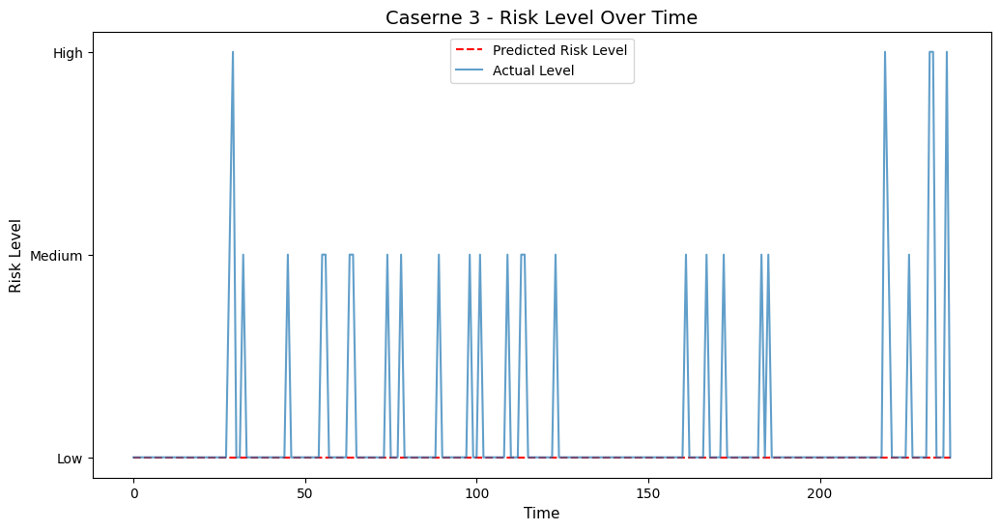

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


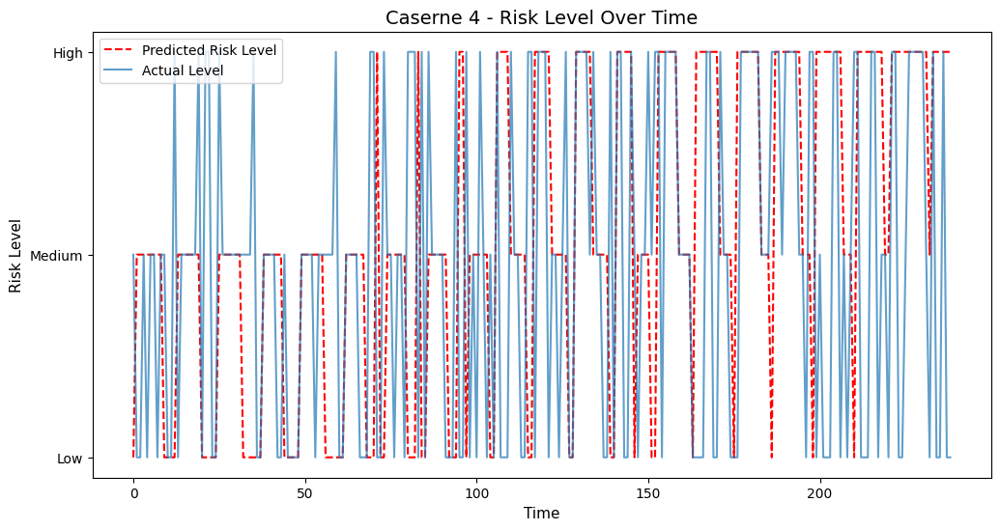

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


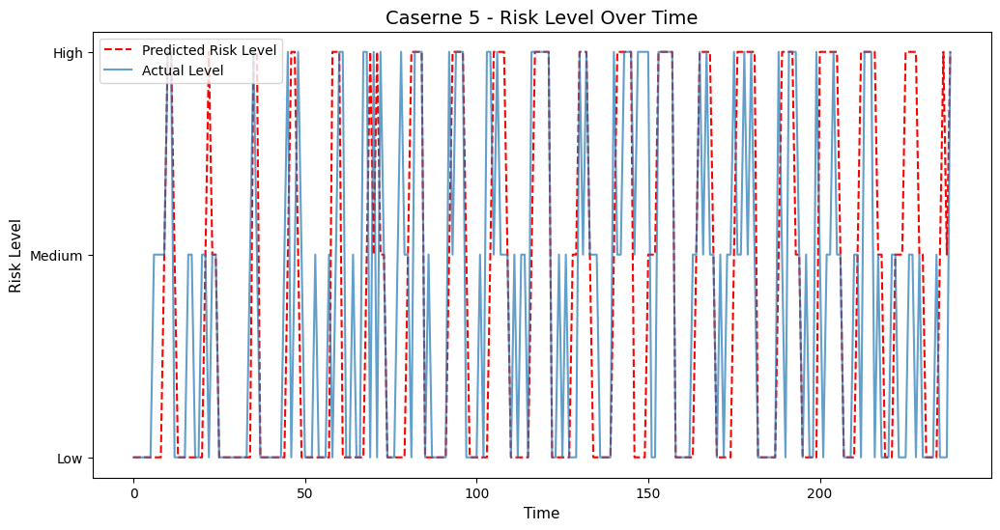

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


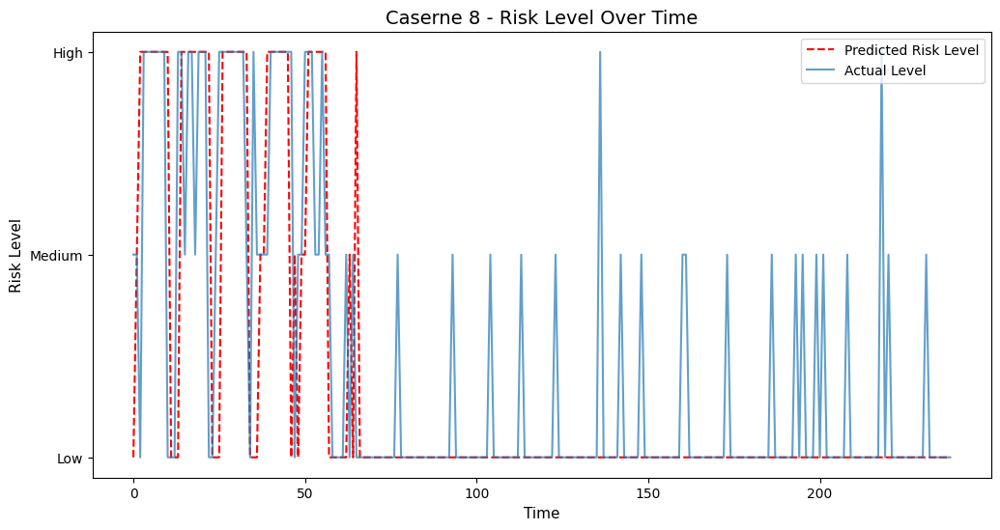

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


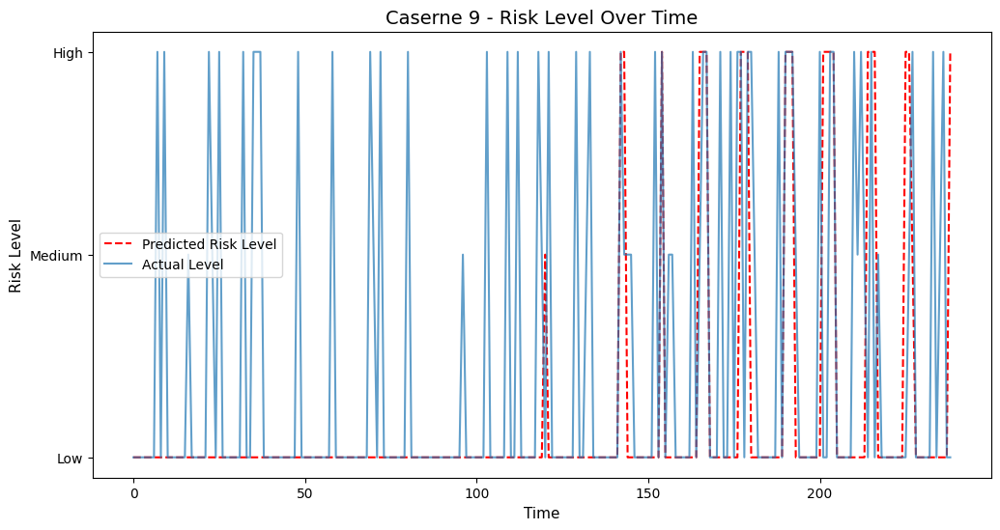

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


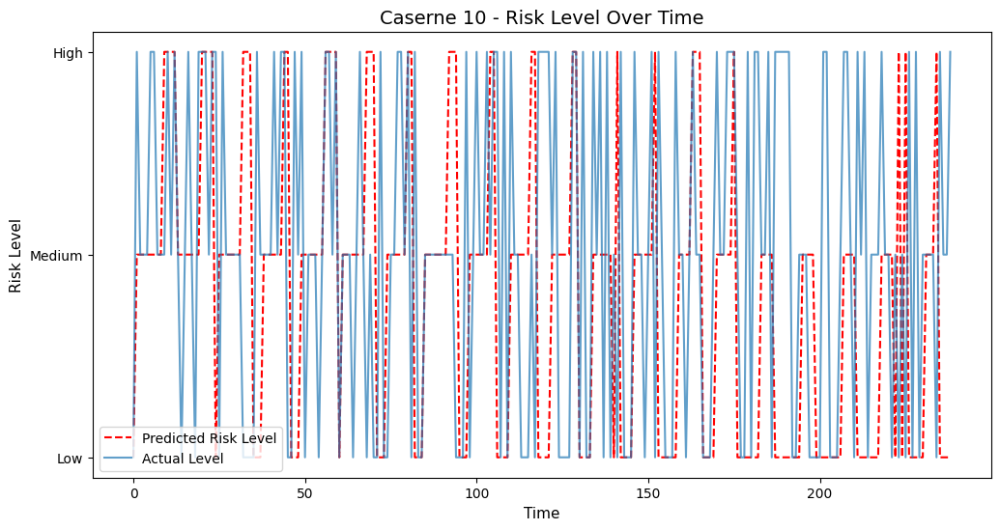

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


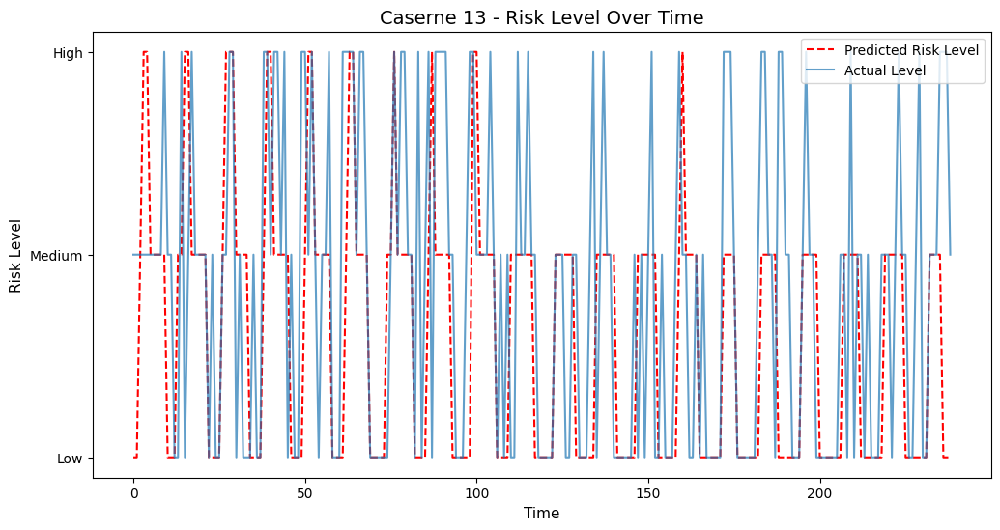

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


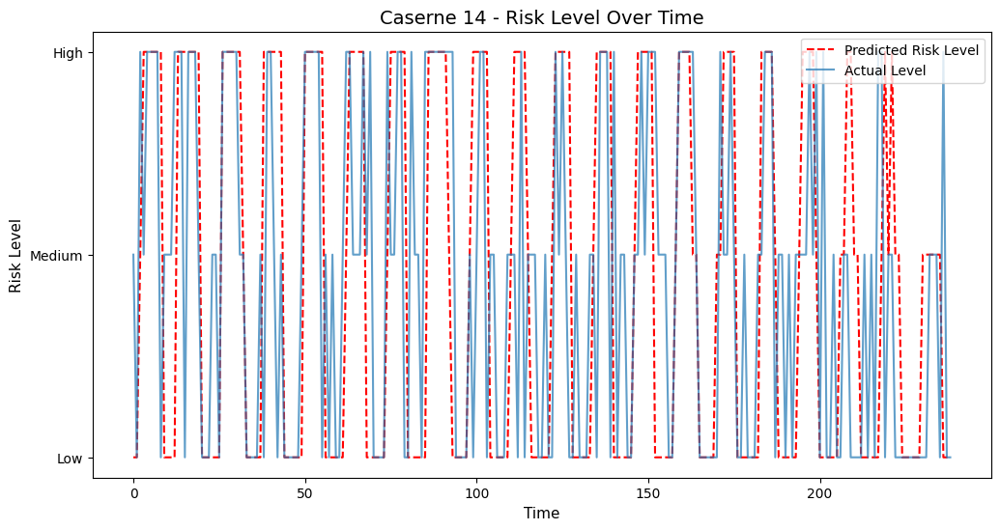

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


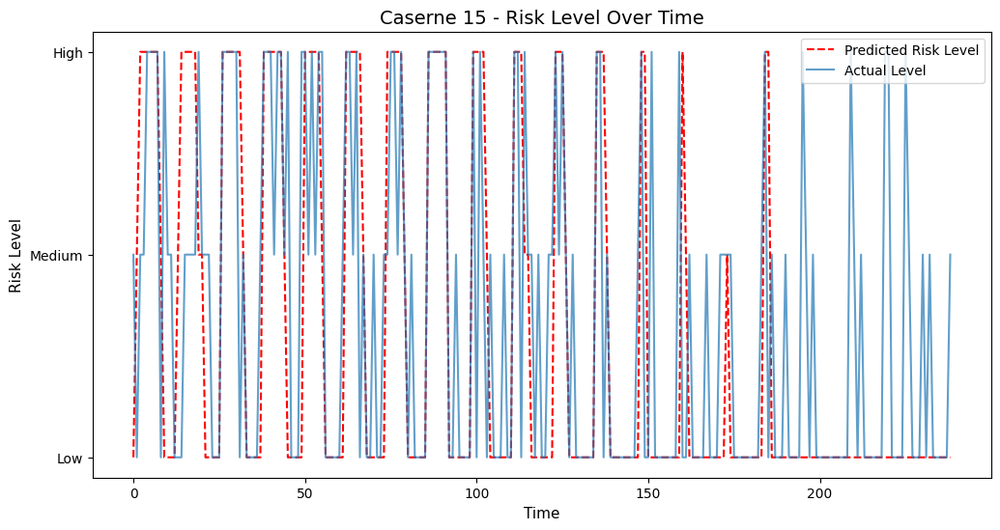

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


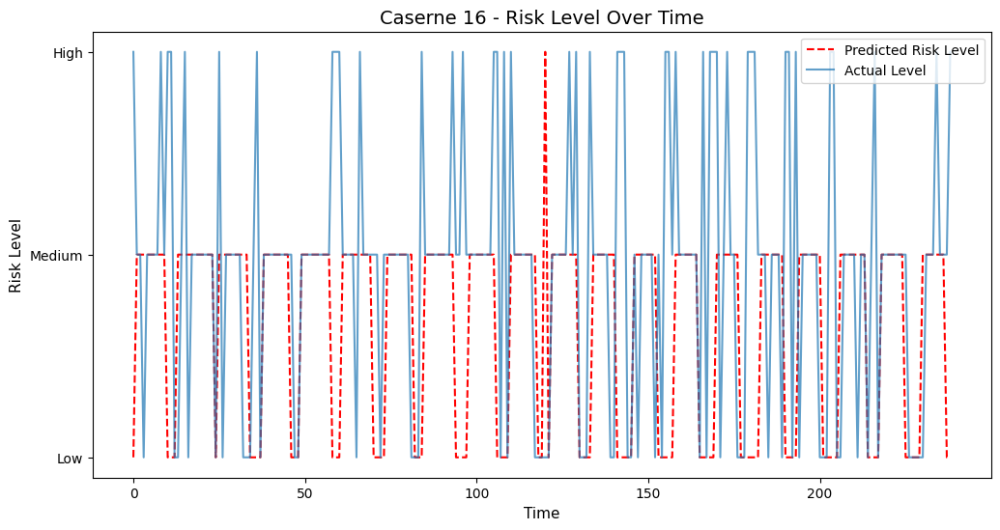

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


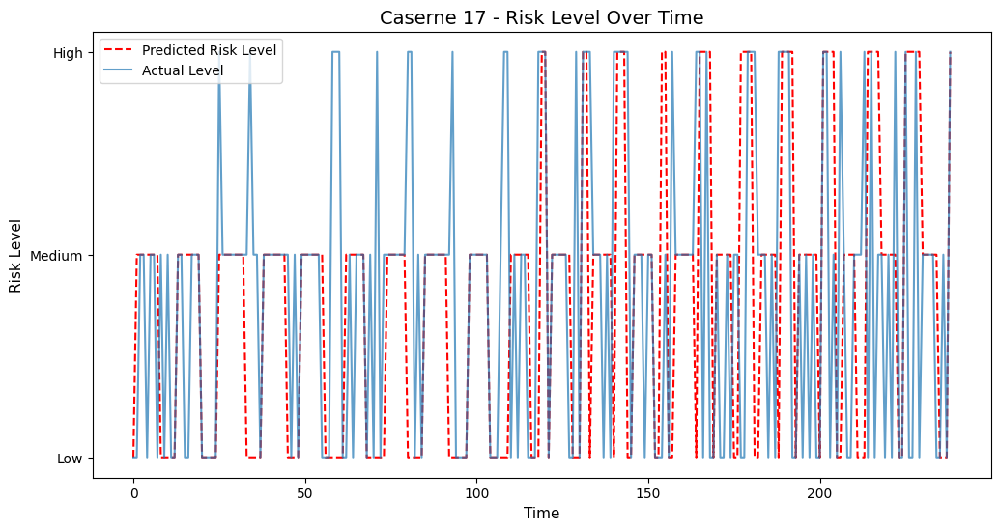

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


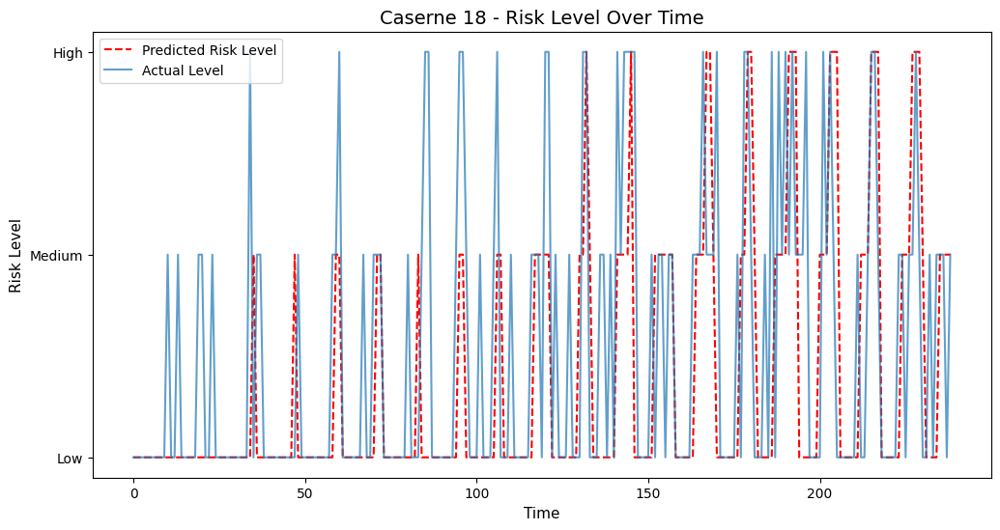

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


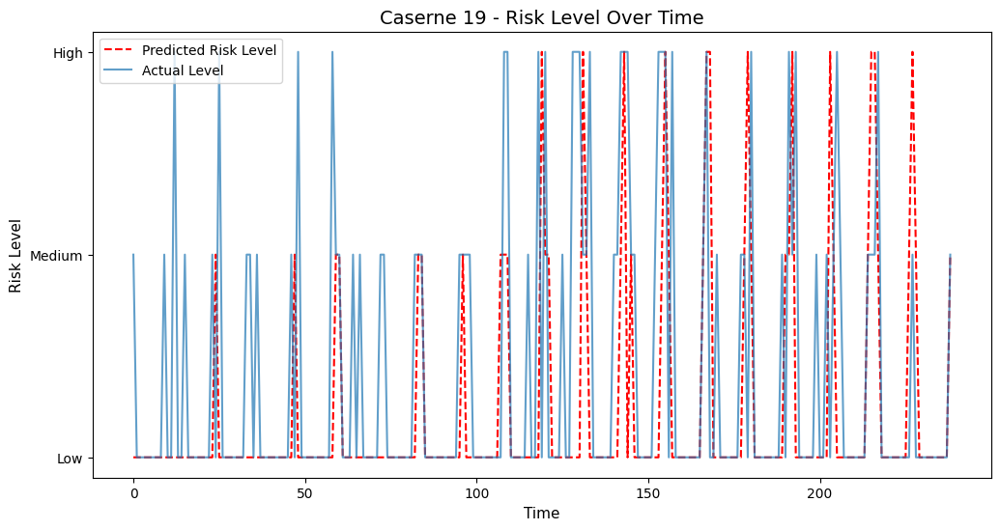

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


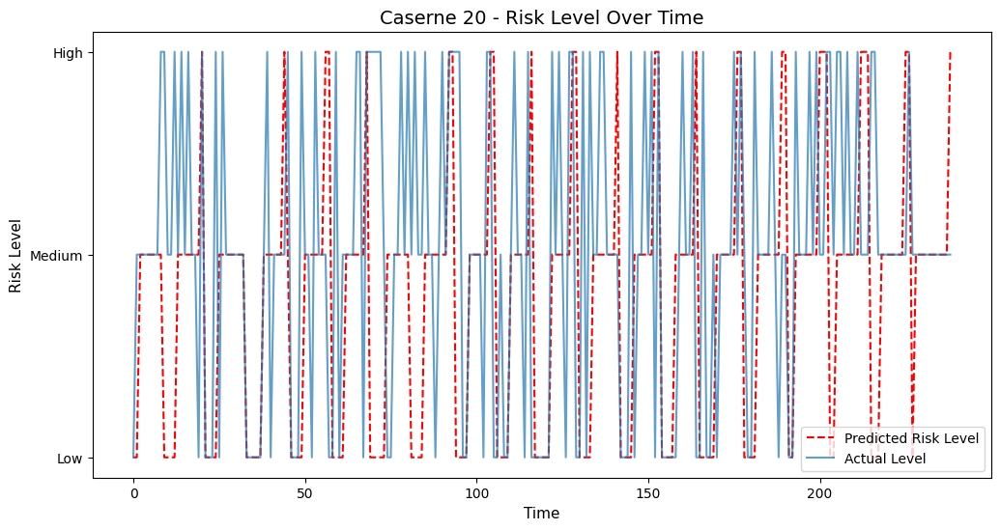

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


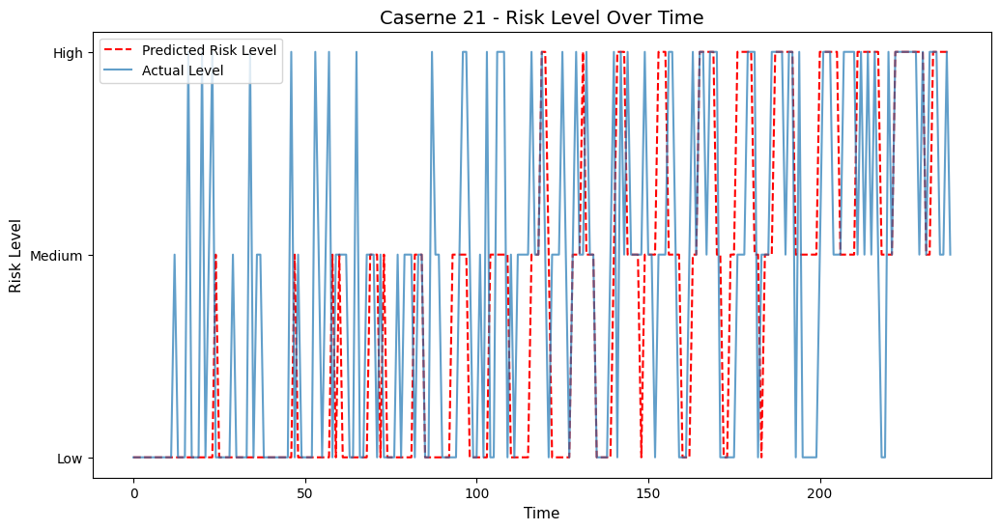

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


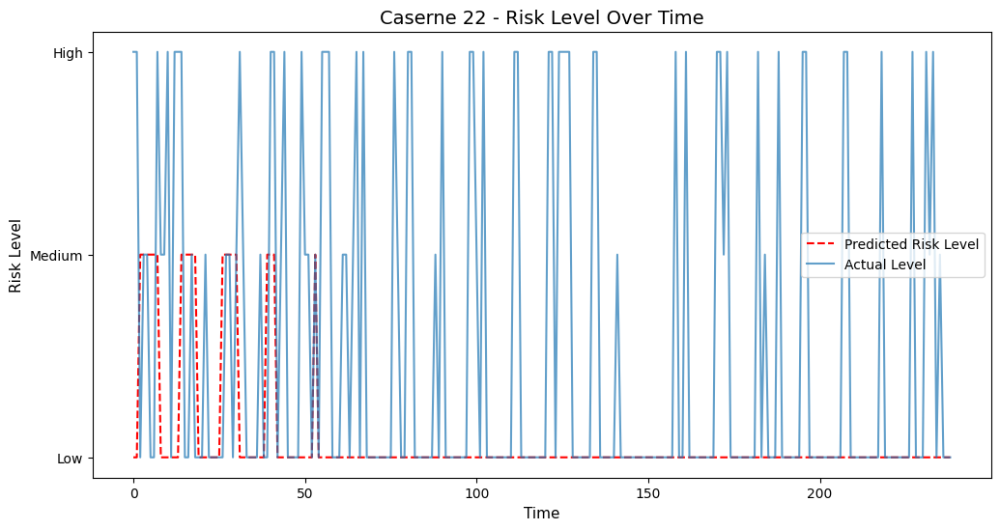

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


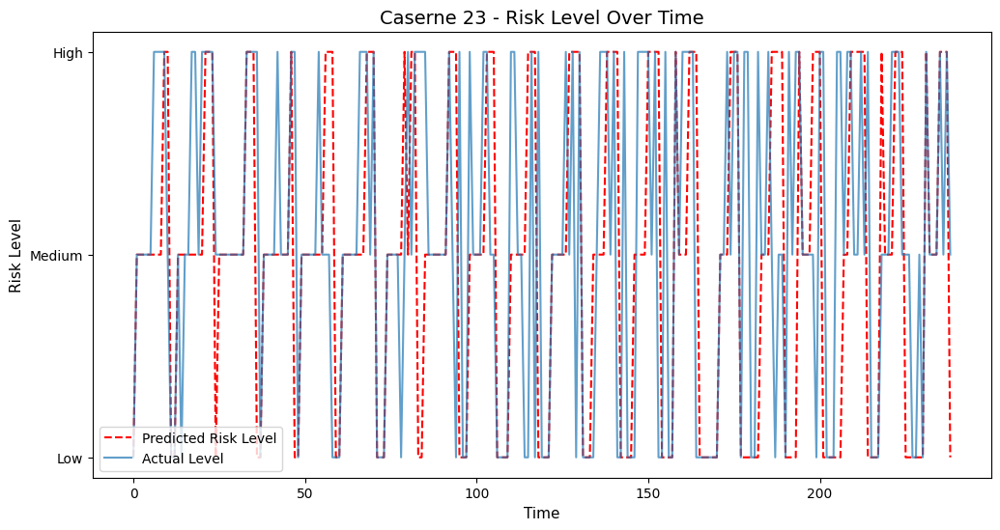

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


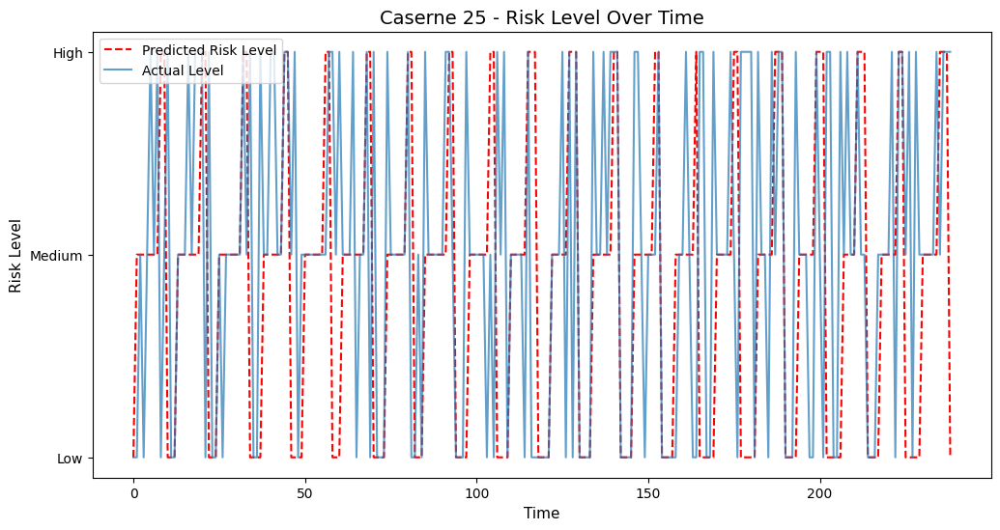

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


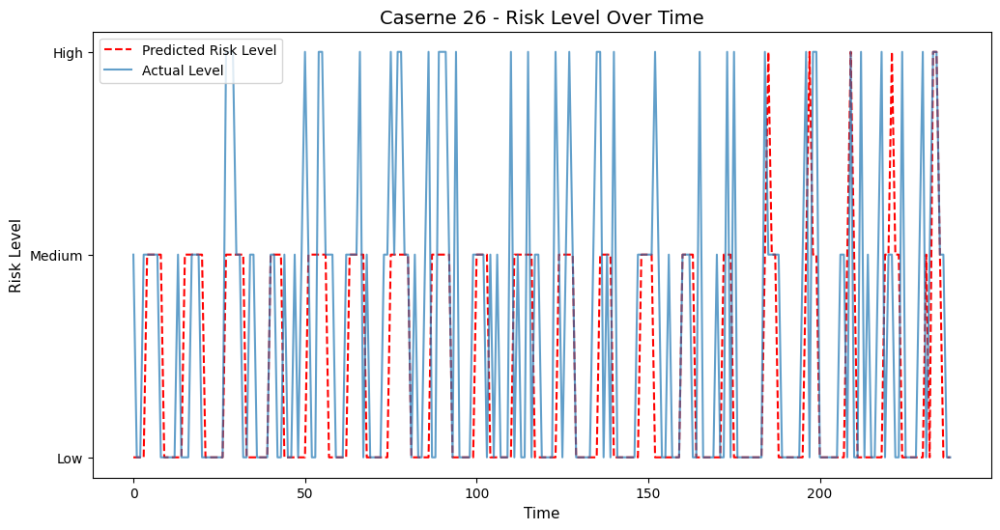

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


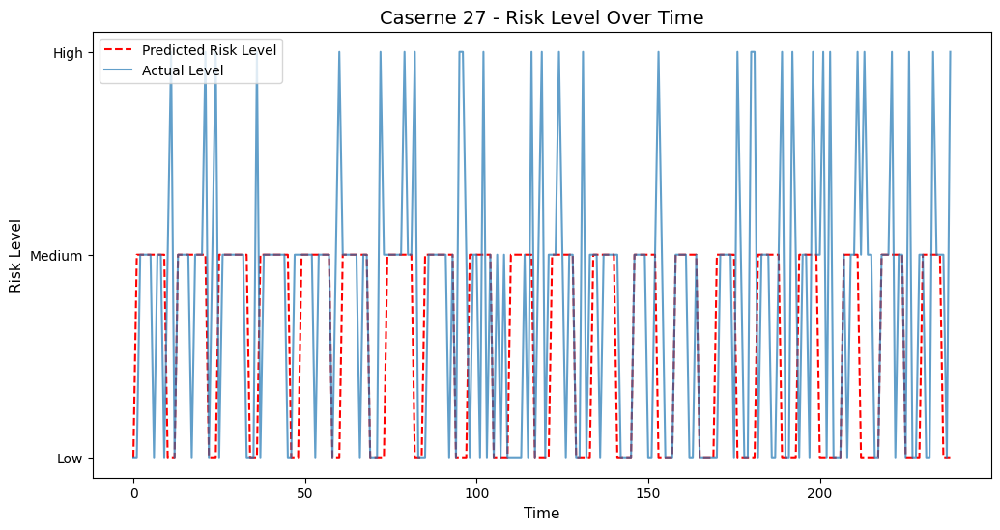

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


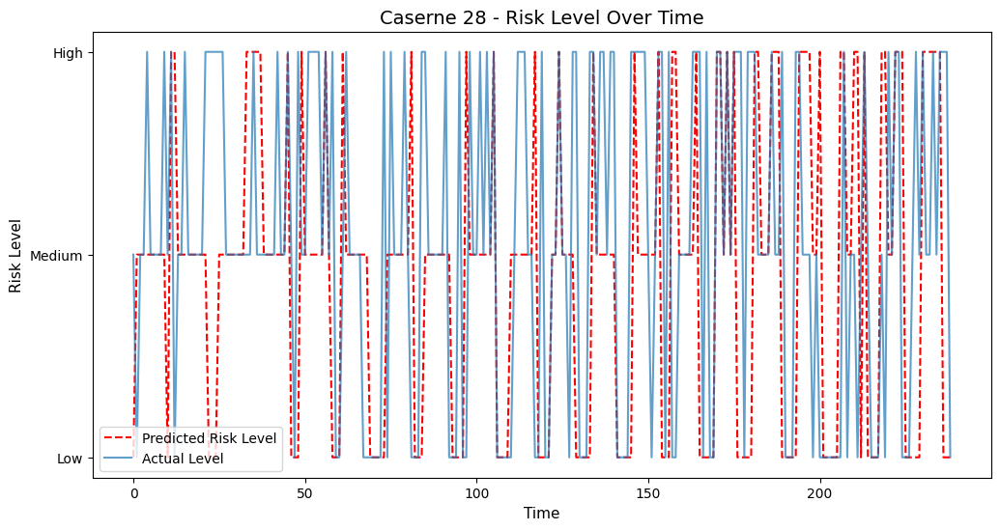

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


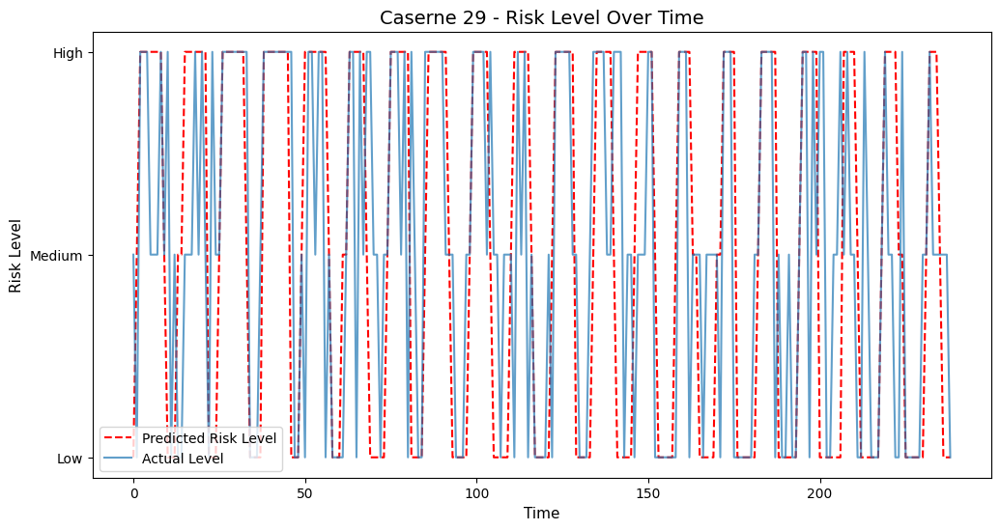

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


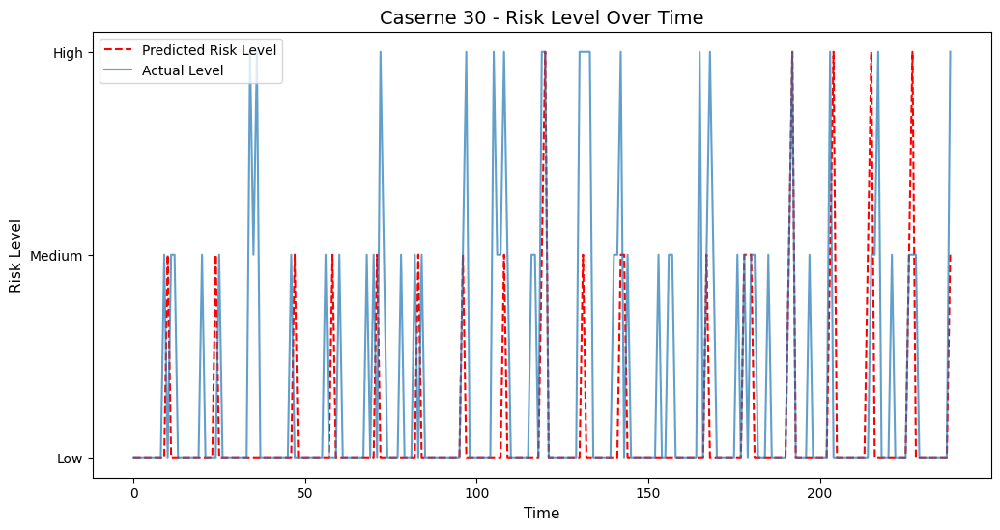

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


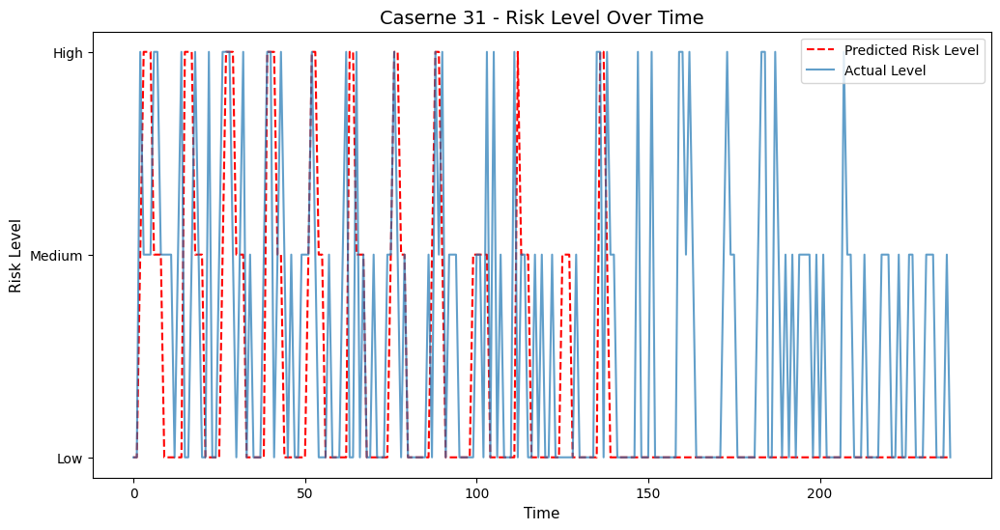

5/5 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


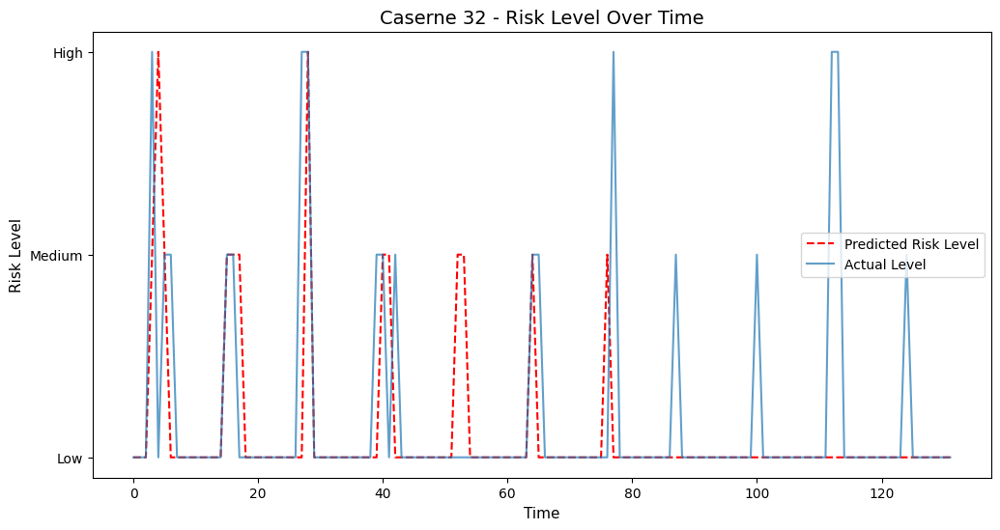

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


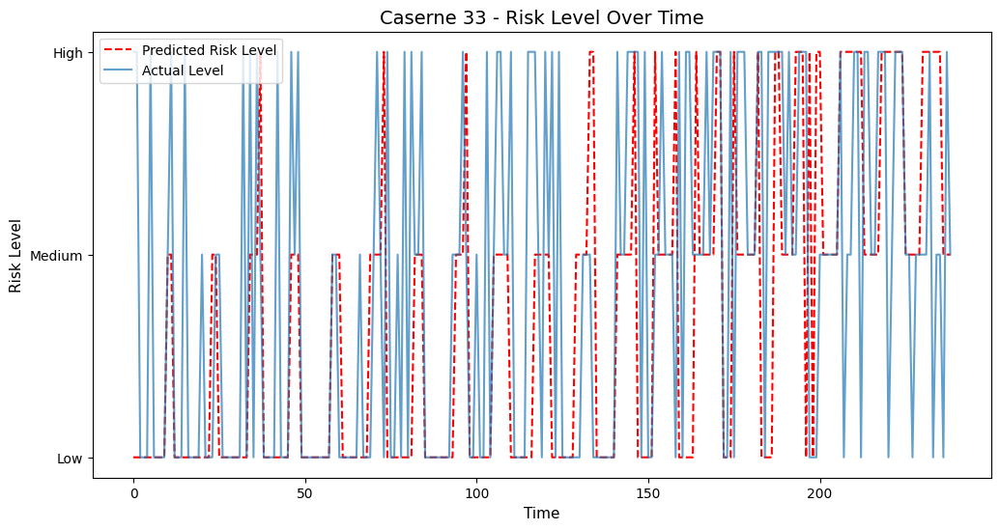

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


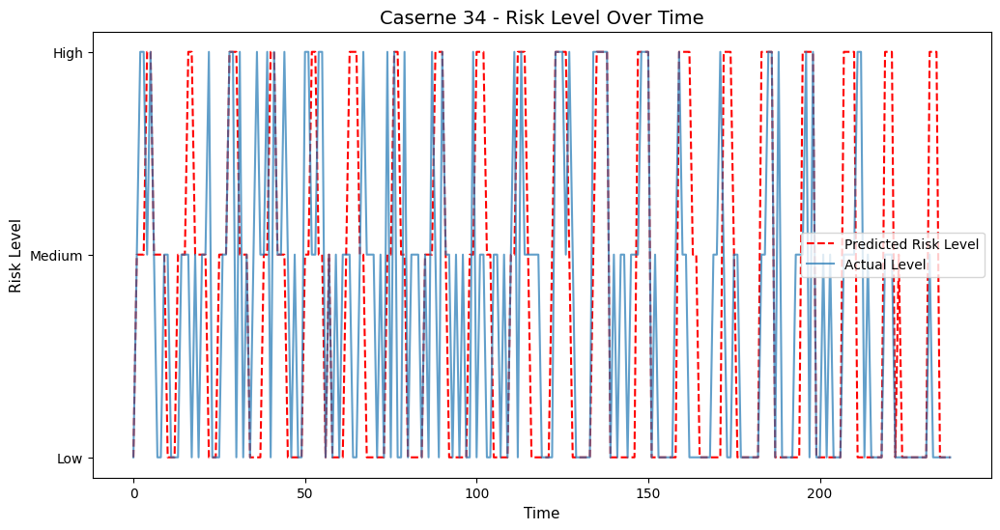

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


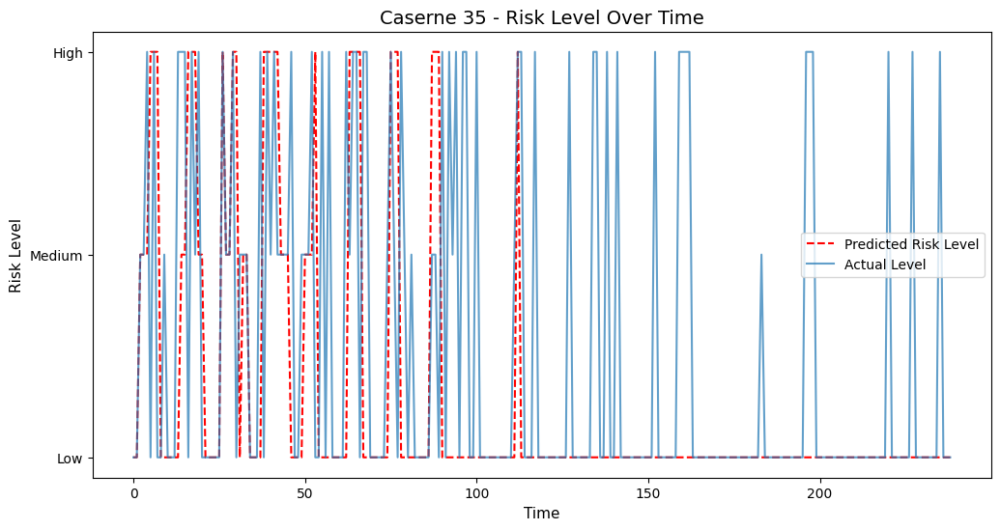

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


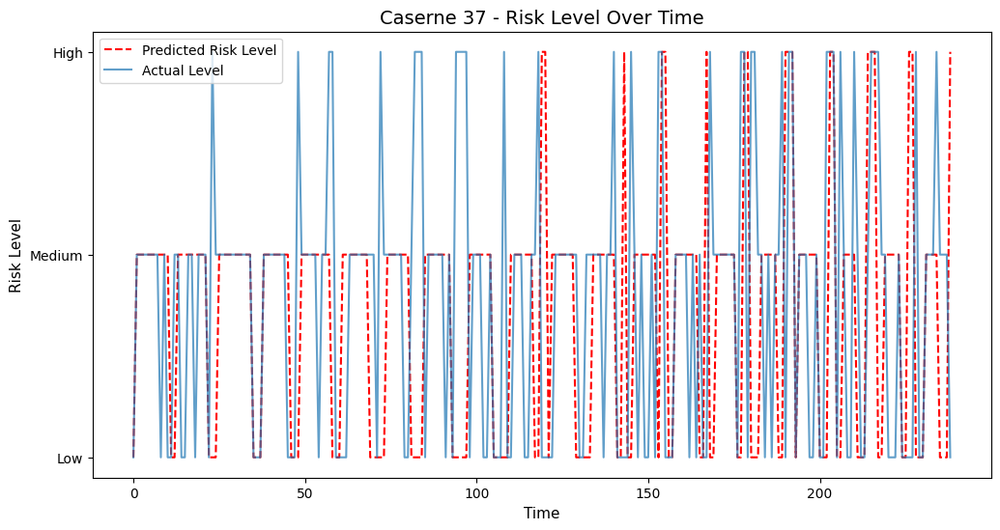

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


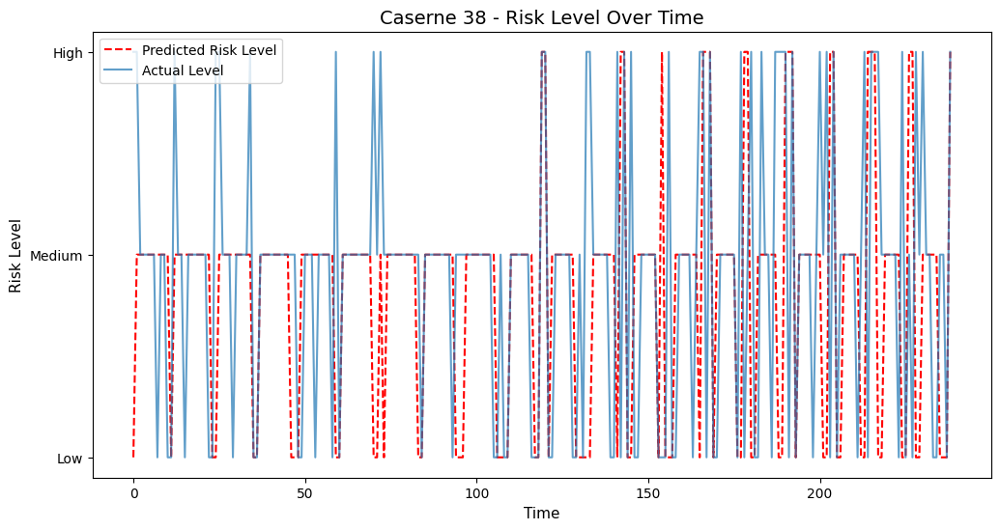

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


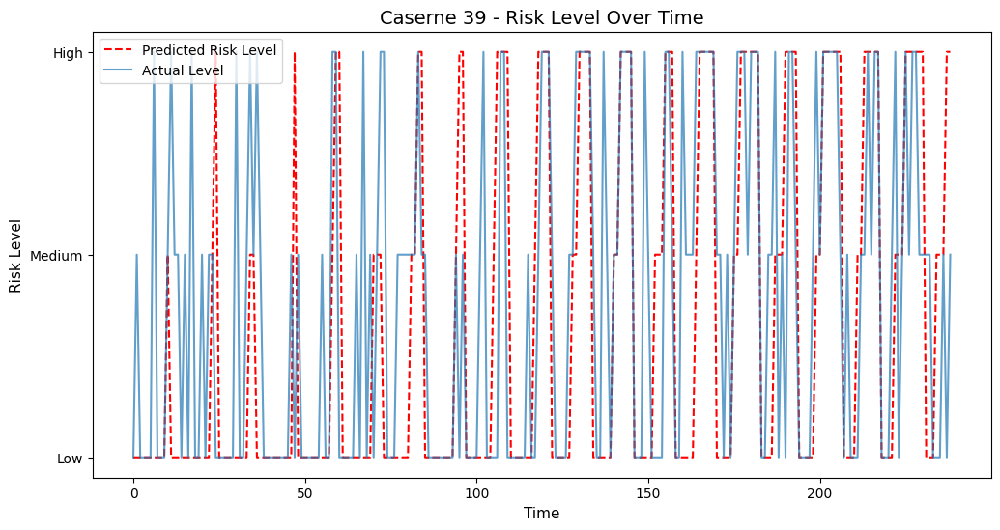

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


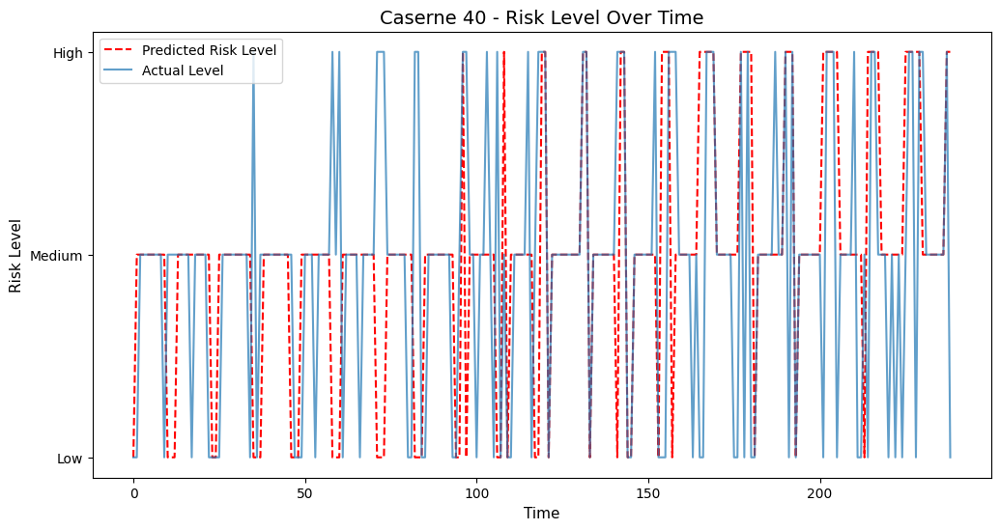

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


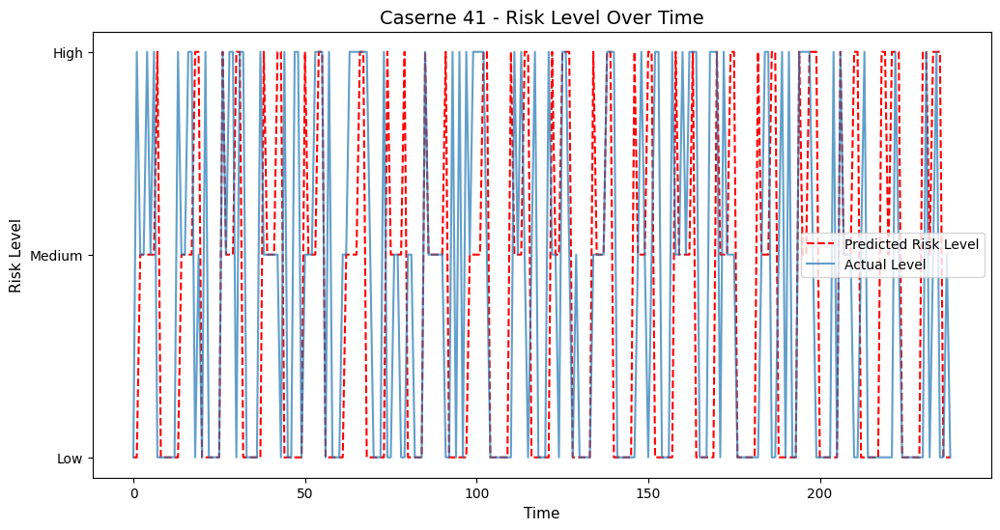

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


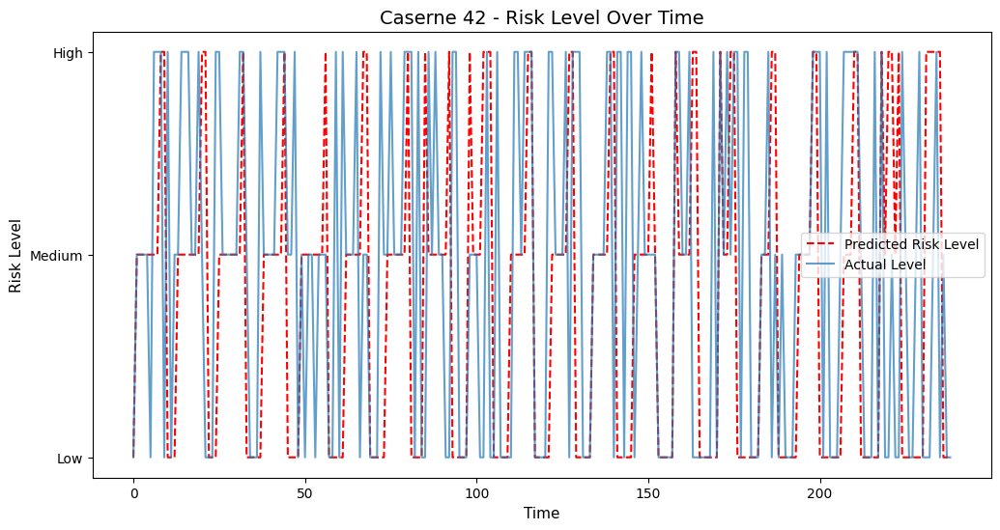

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


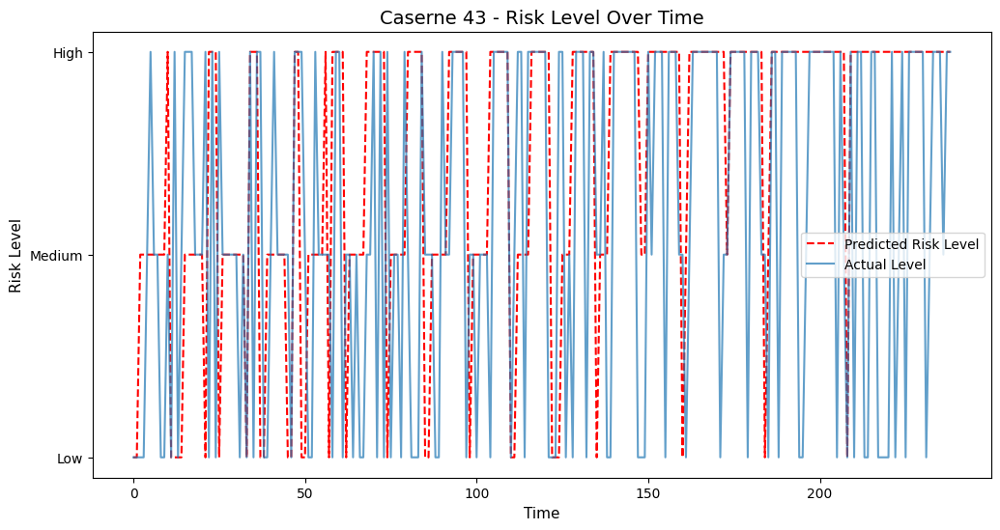

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


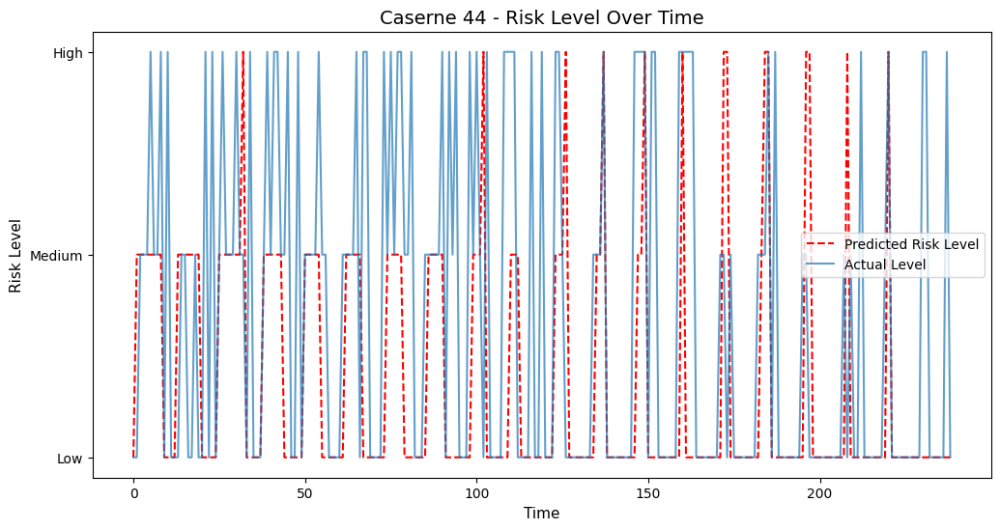

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


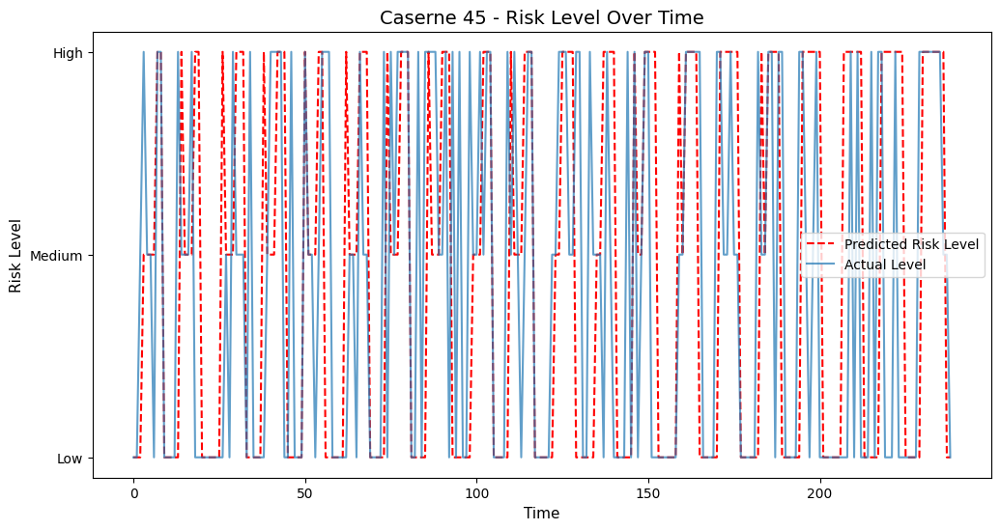

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


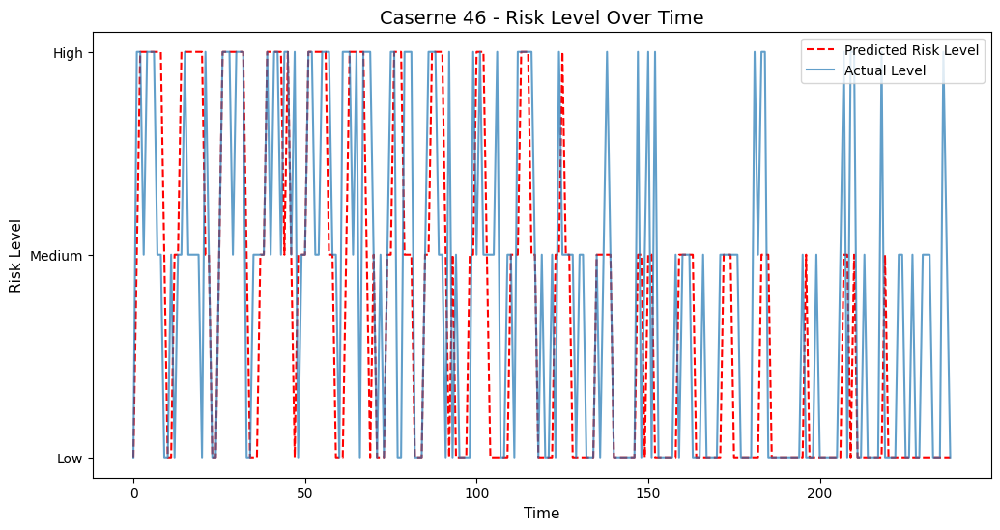

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


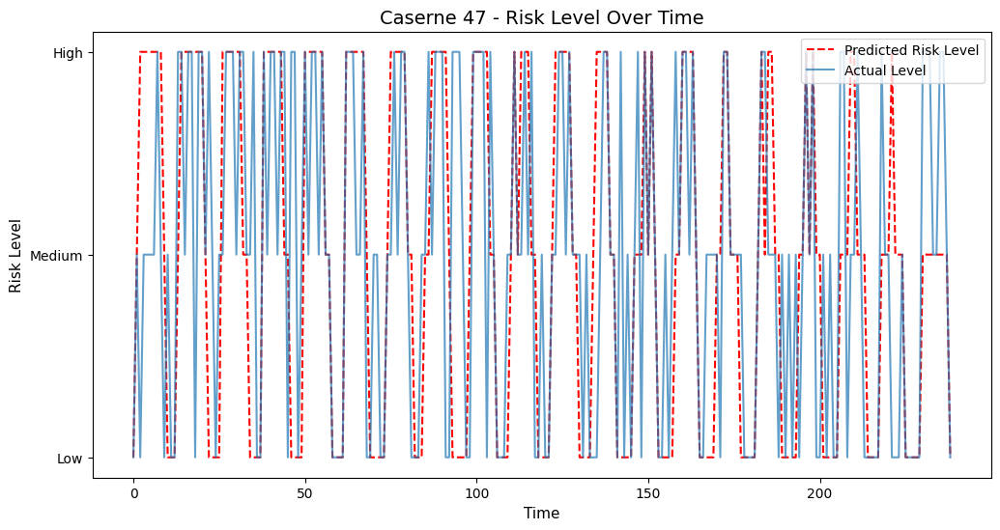

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


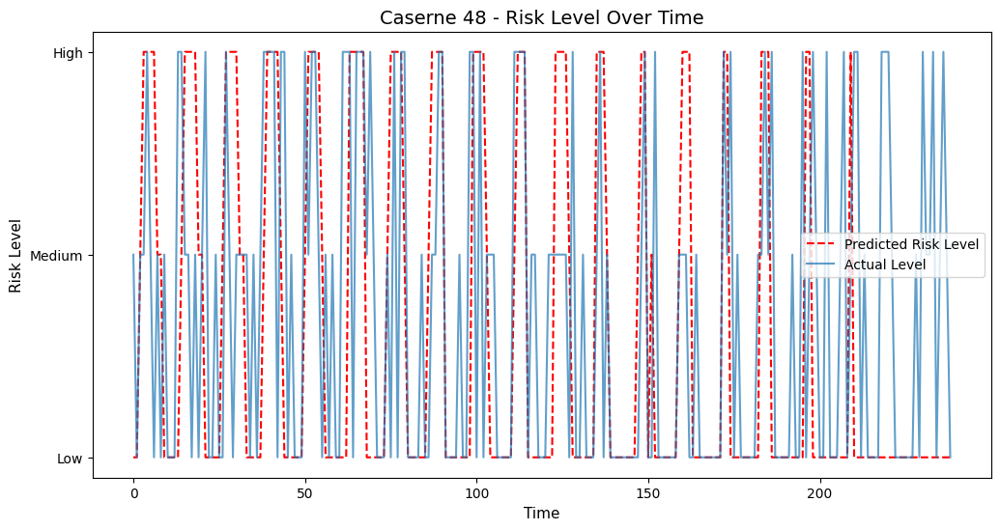

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


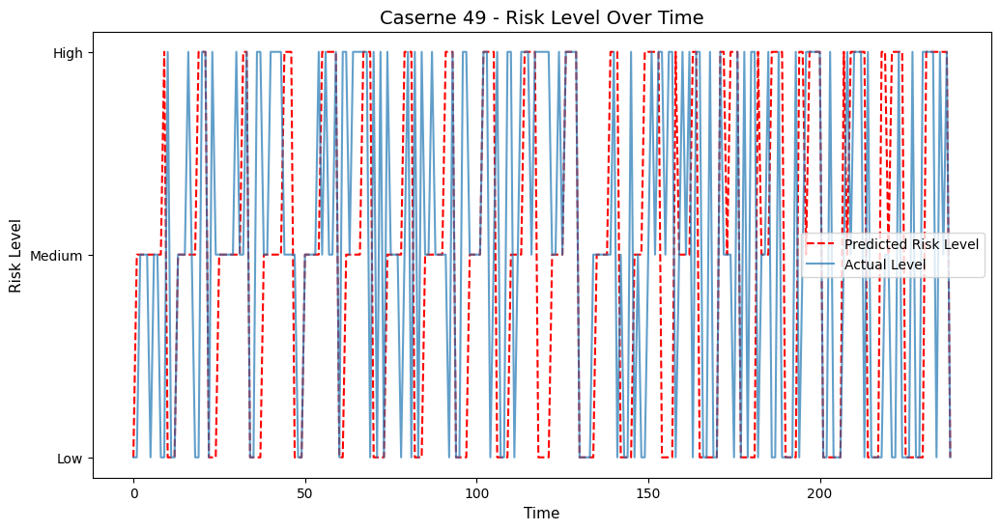

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


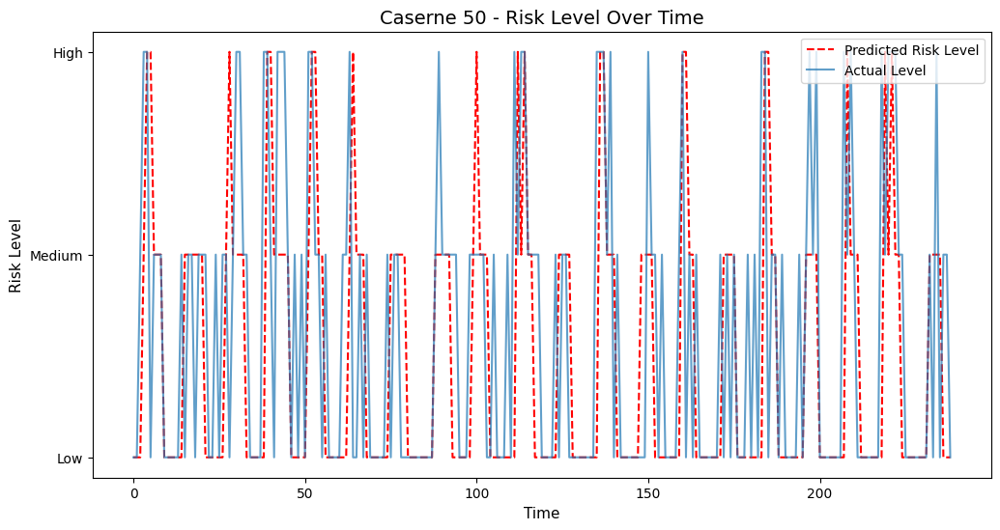

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


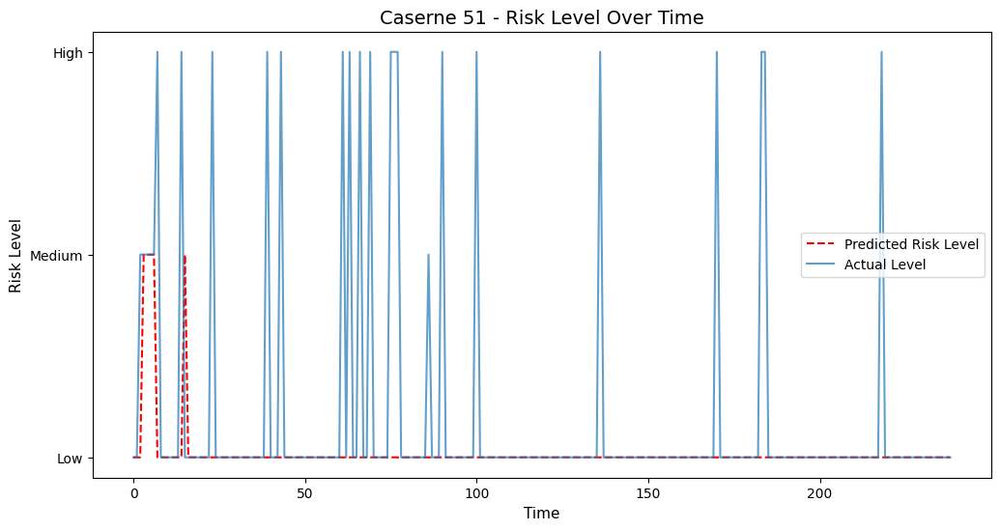

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


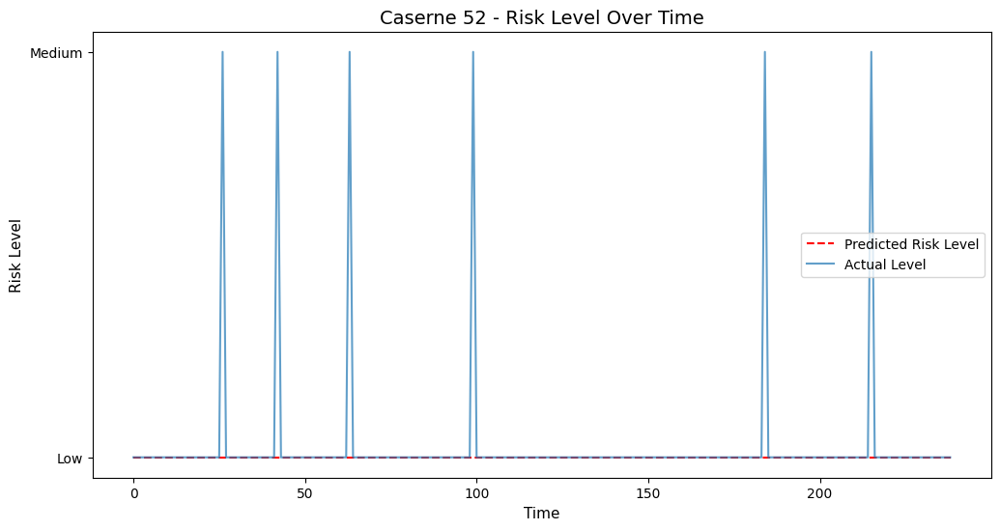

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


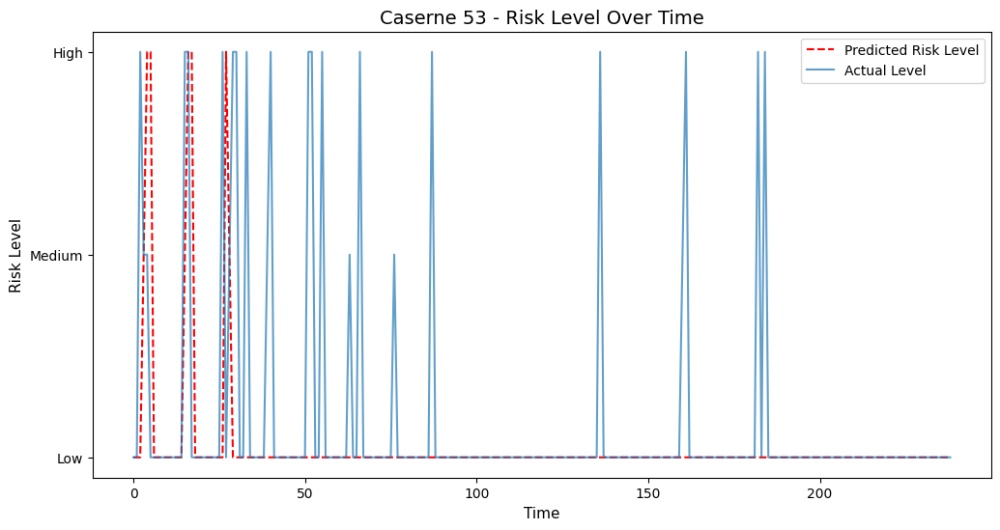

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


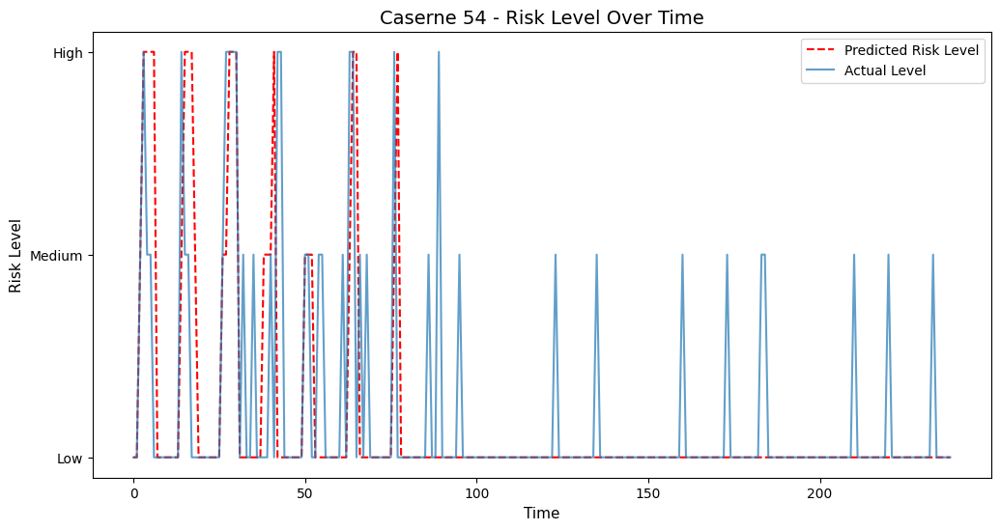

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


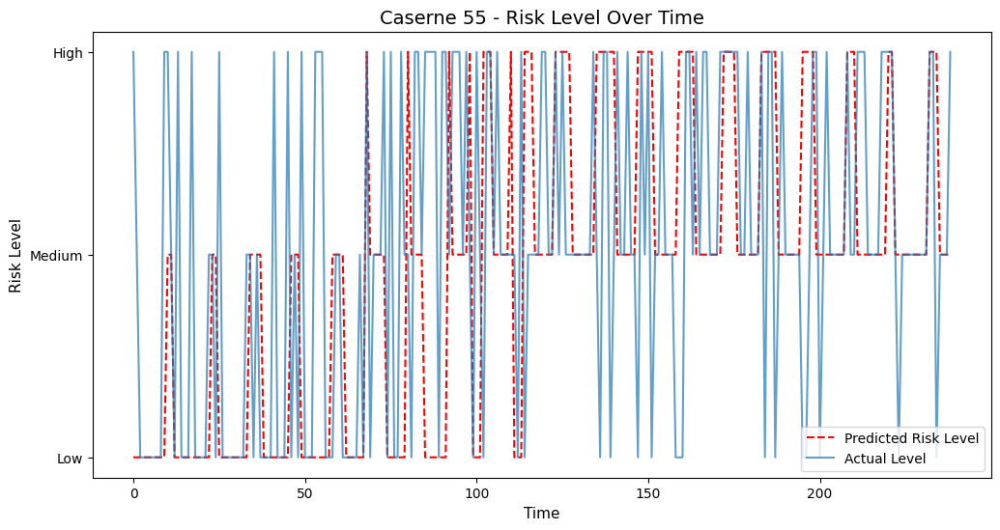

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


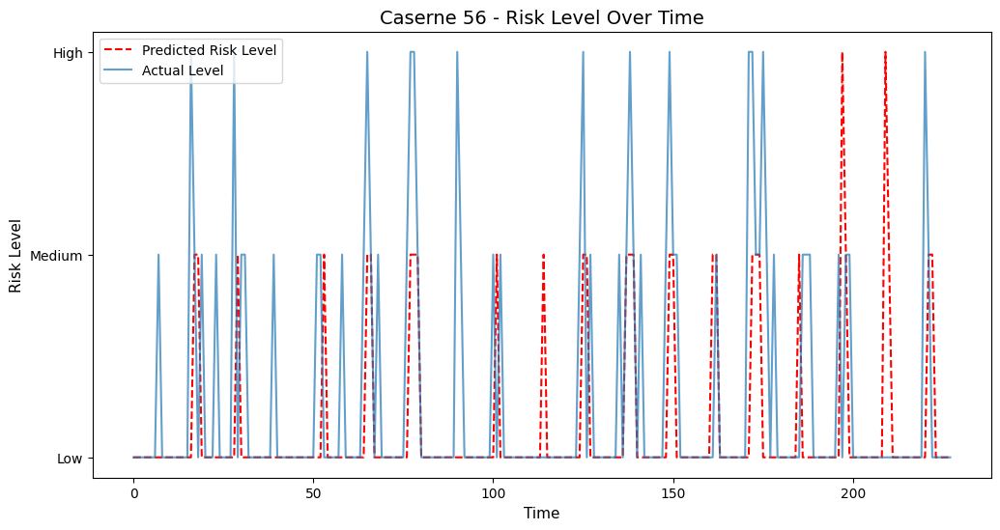

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


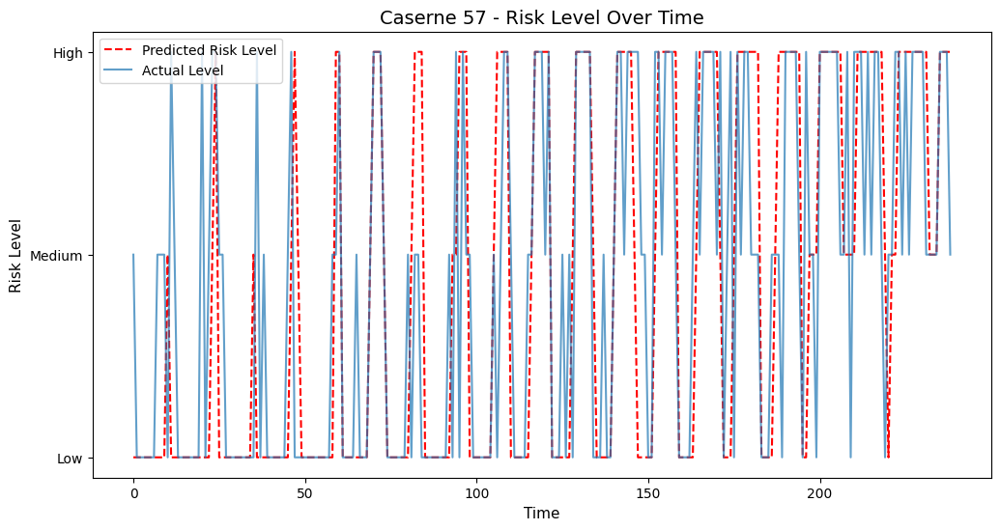

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


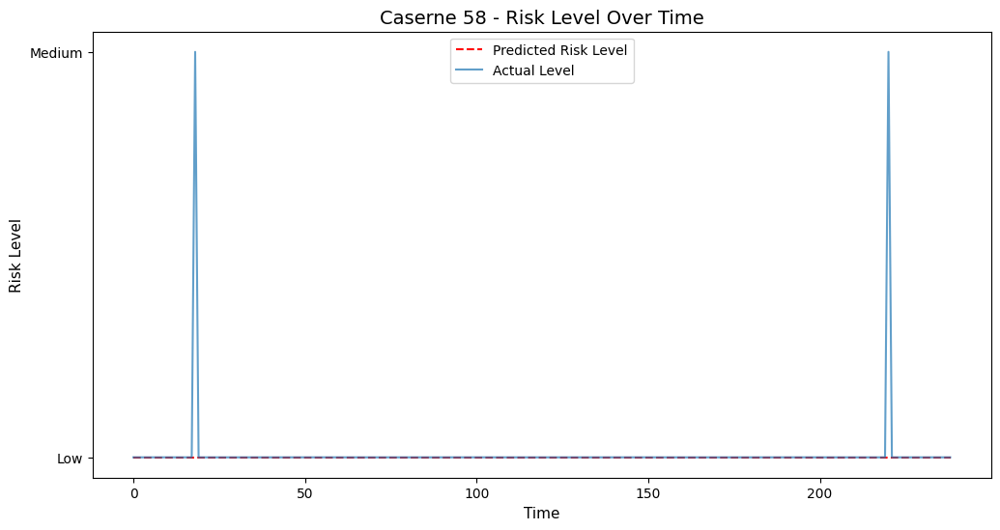

5/5 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


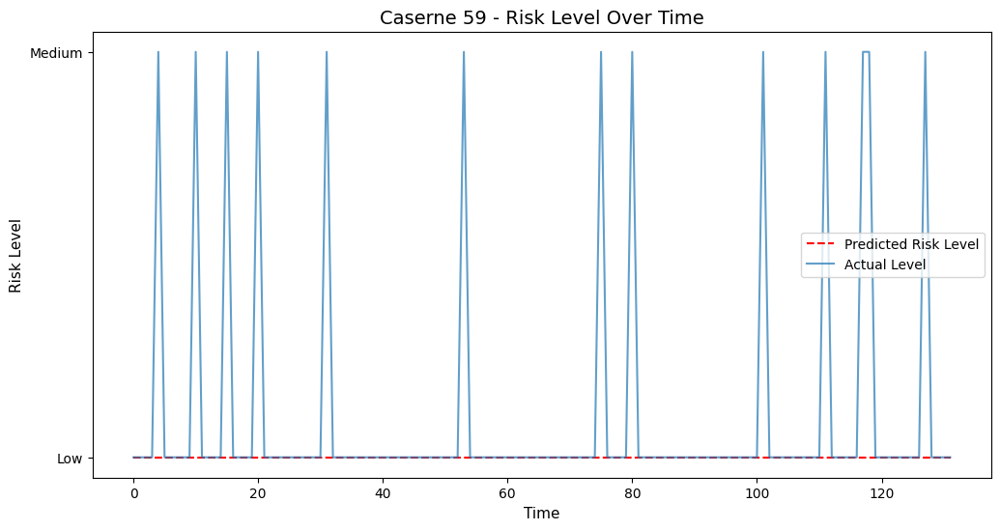

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


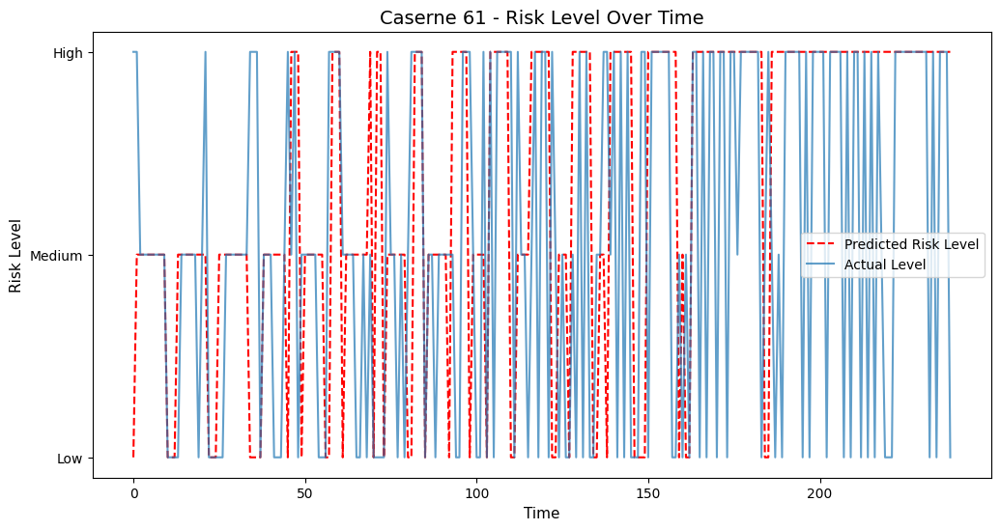

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


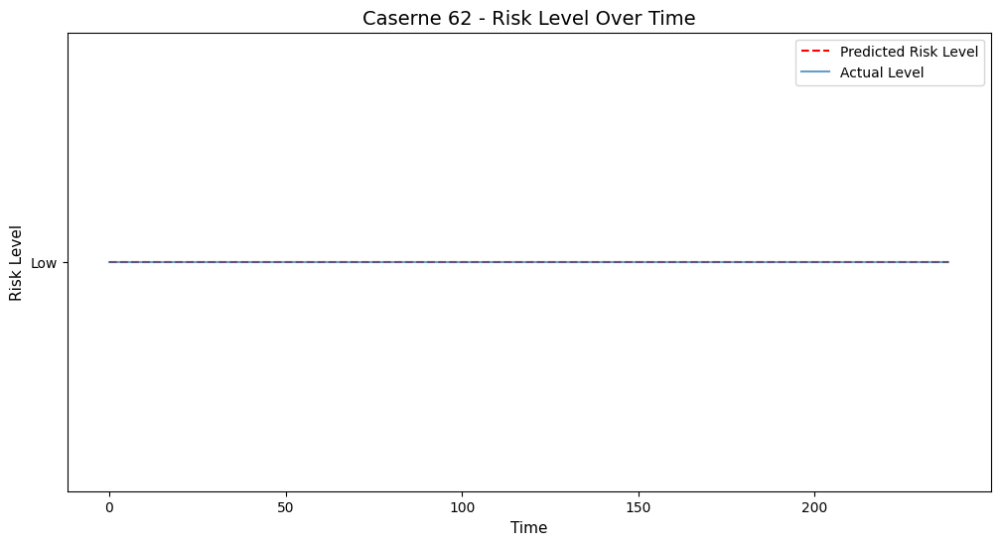

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


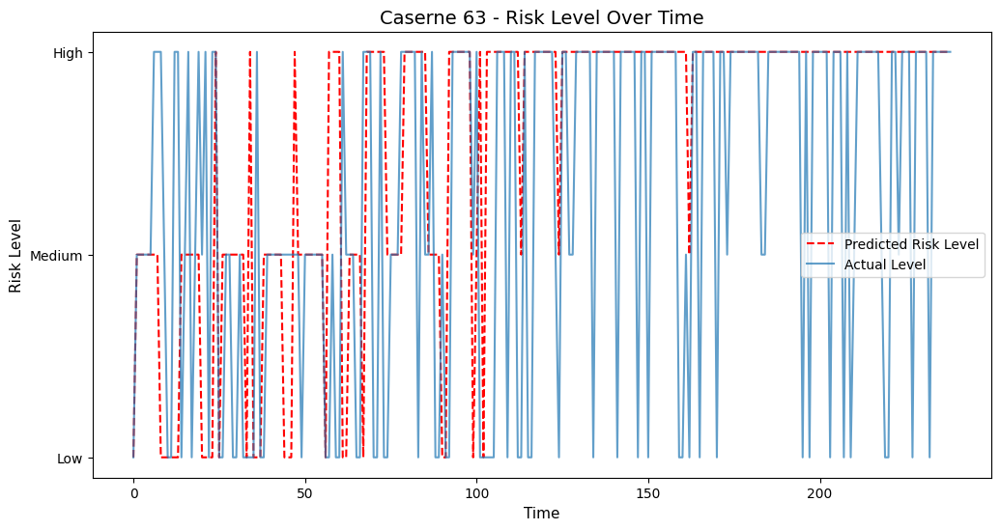

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


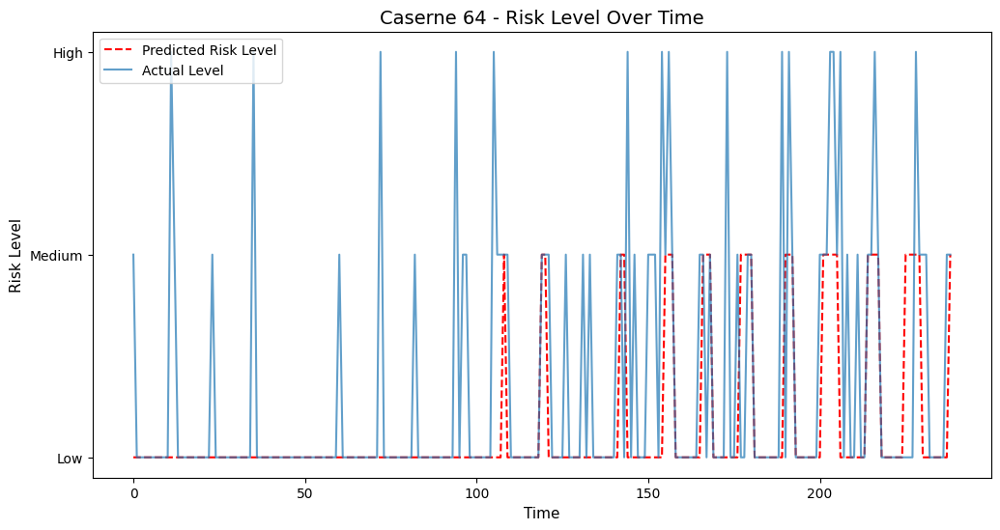

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


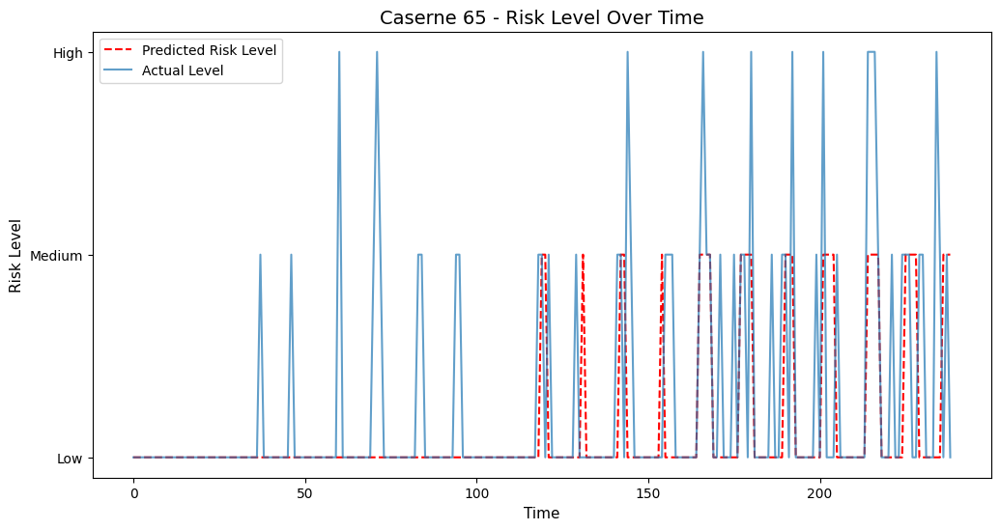

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


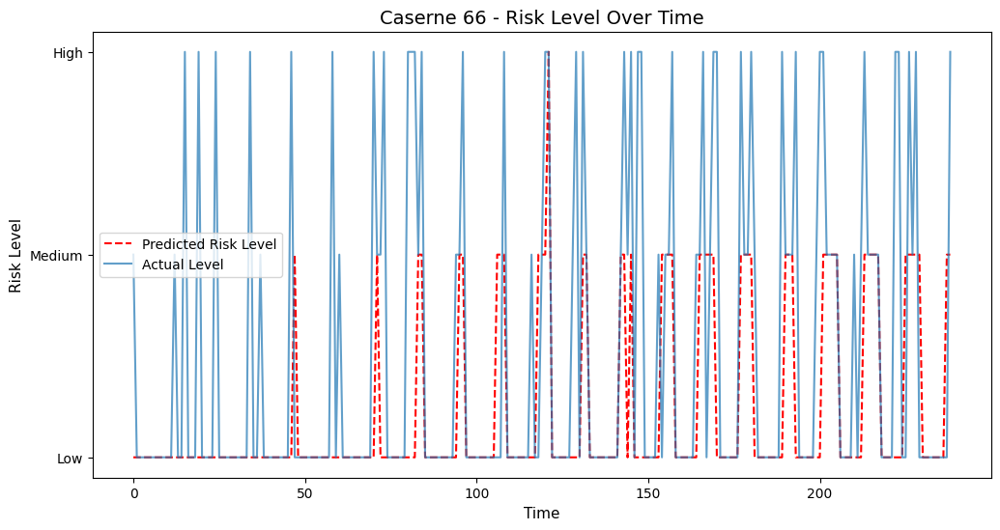

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


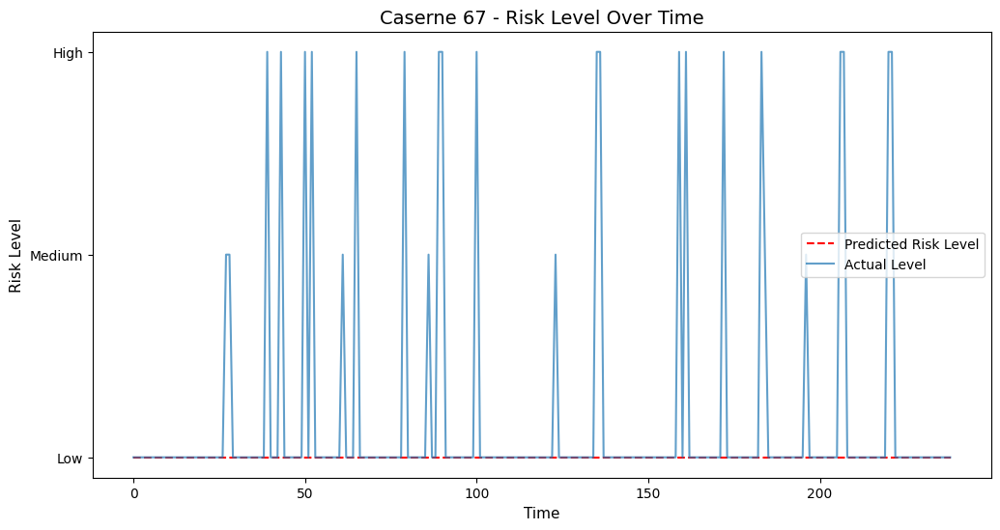

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


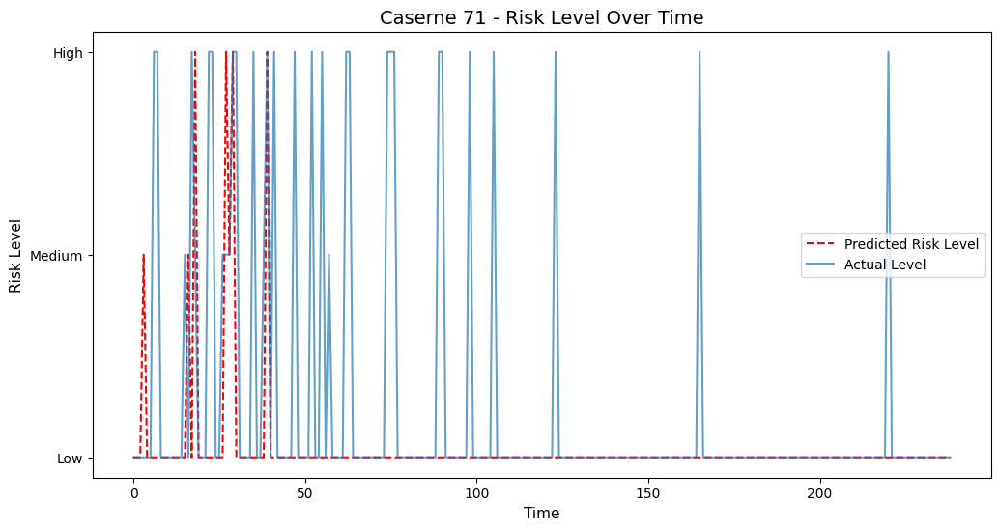

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


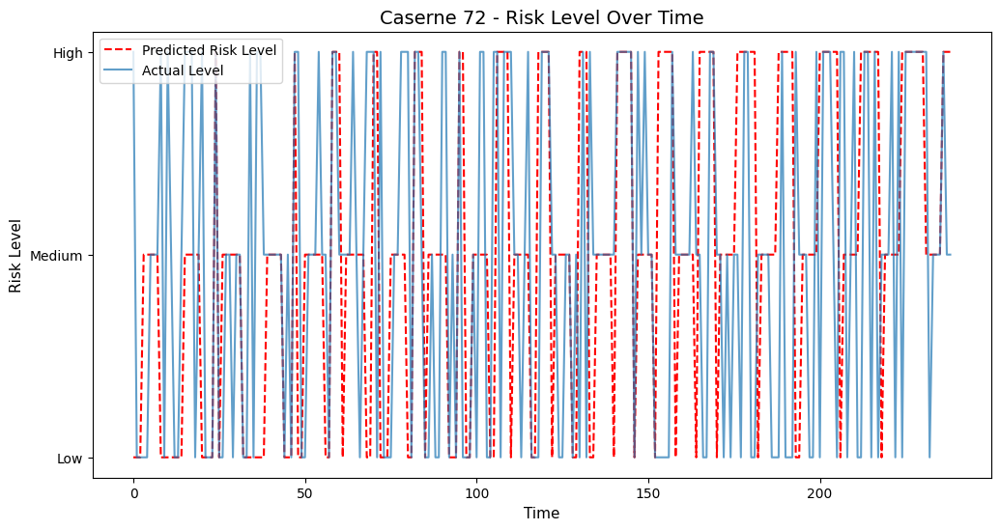

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


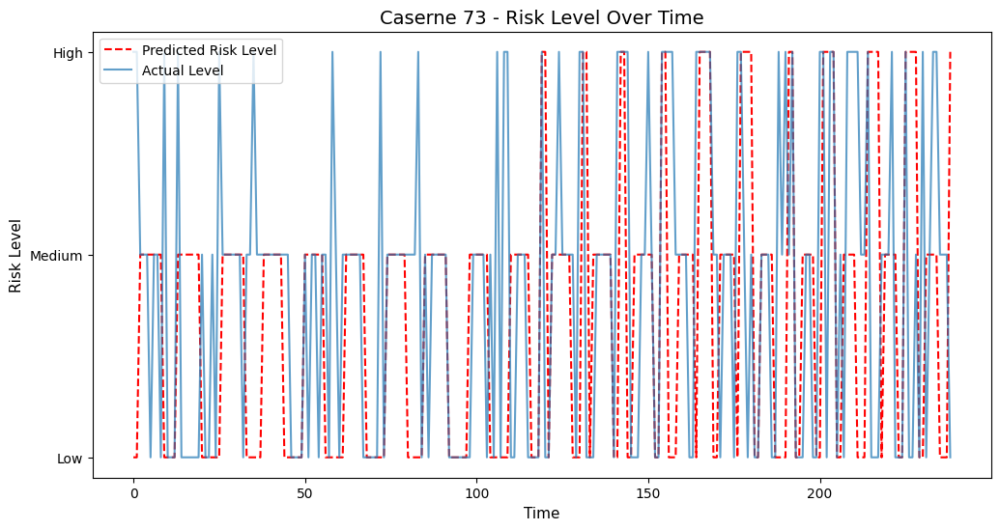

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


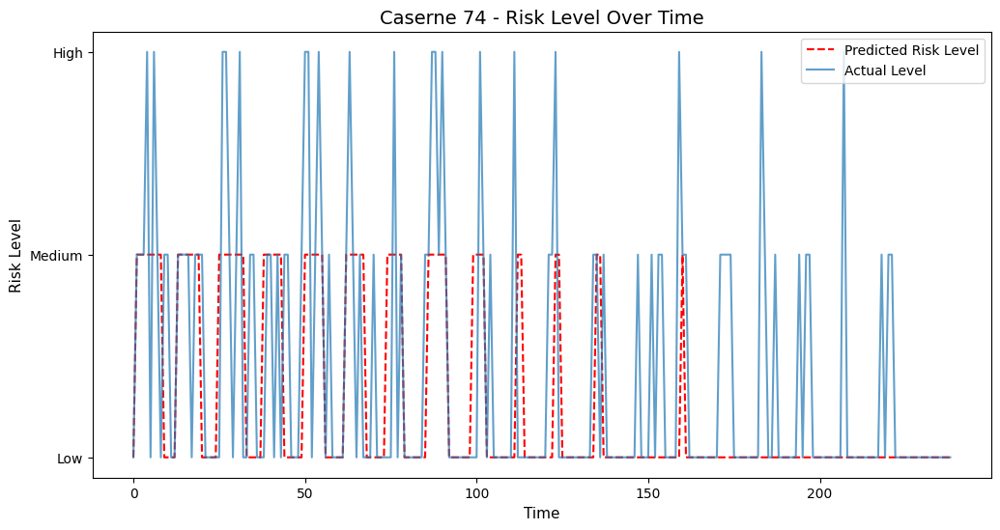

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


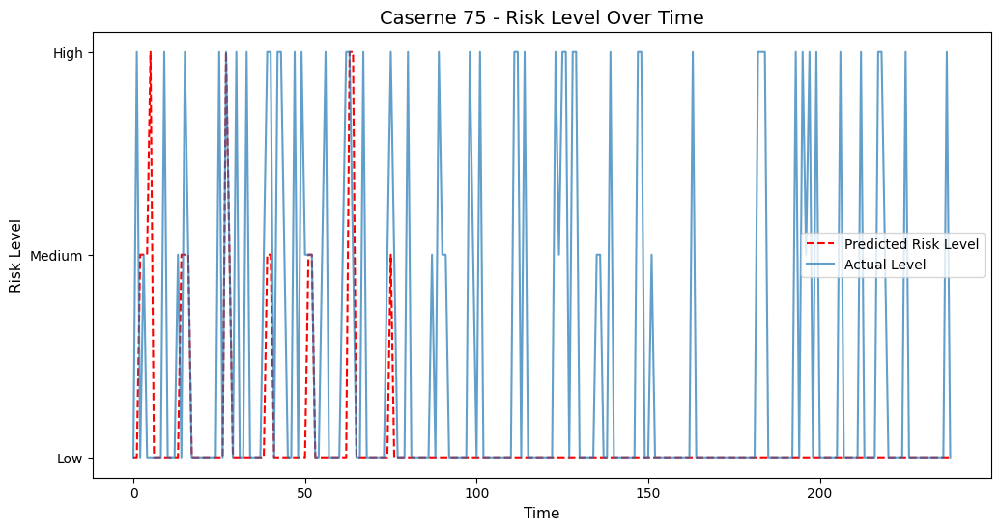

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


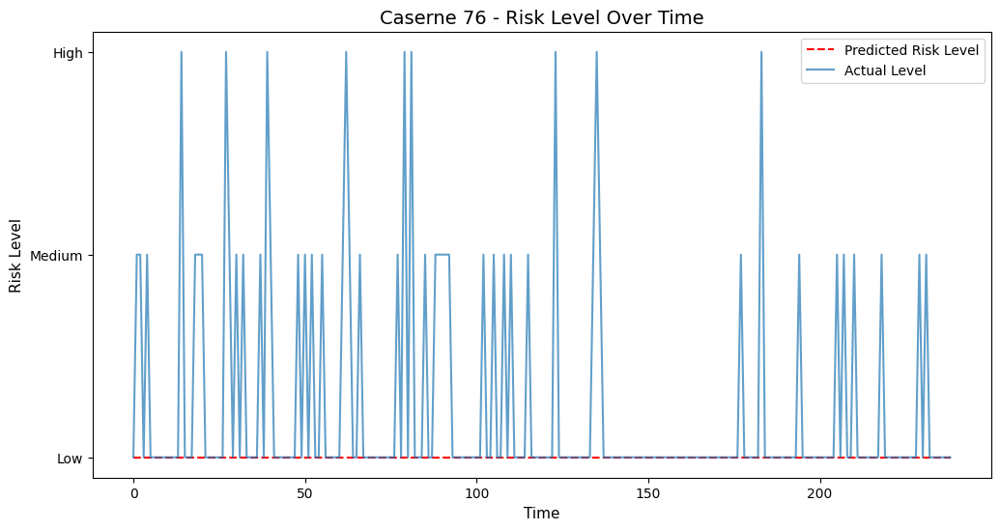

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


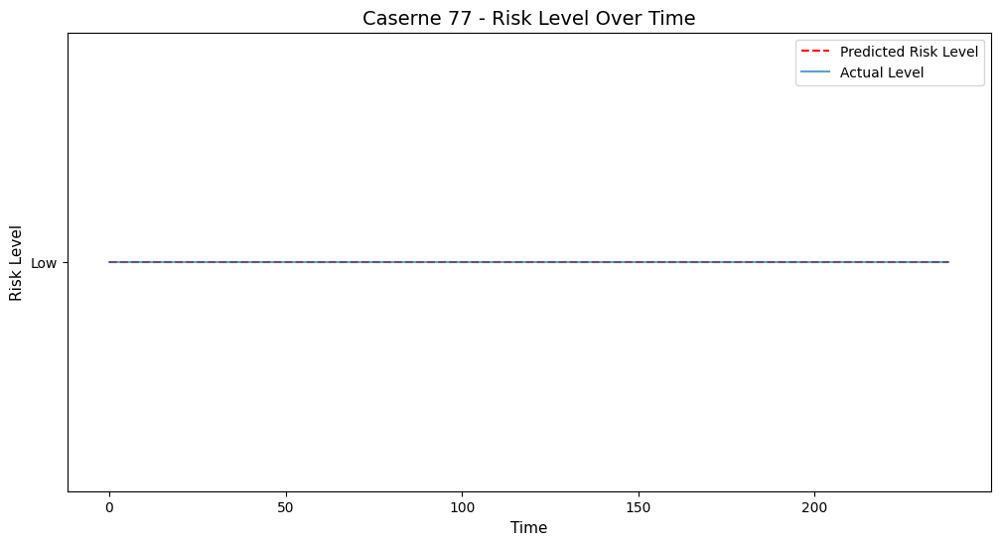

8/8 [==============================] - 0s 1ms/step


<ipython-input-39-8c42645051d2>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(levels.index, rotation=0)


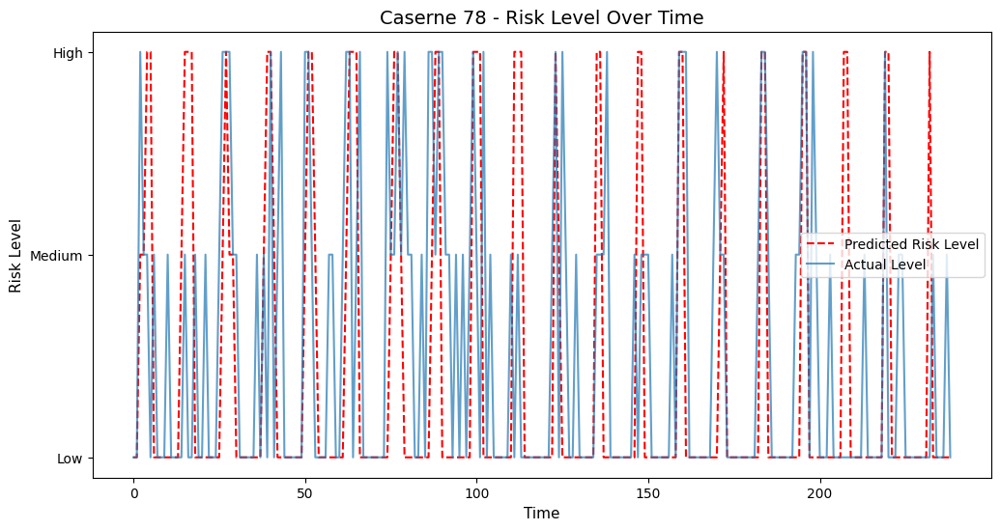

In [39]:
label_encoder = LabelEncoder()
label_encoder.fit(df_merged['RISK_LEVEL'].values)

for cas_no in dict_casernes.keys():
  X = dict_casernes[cas_no][[
    'YEAR',
    'MONTH_SIN',
    'MONTH_COS',
    'LAG1_INCIDENT_COUNT',
    'TEMPERATURE_MAX'
  ]].values

  scaler = MinMaxScaler()
  X_scaled = scaler.fit_transform(X)
  X_scaled = X_scaled.reshape(X_scaled.shape[0], 1, X_scaled.shape[1])

  y_pred = models[cas_no].predict(X_scaled)

  pred_label_indices = np.argmax(y_pred, axis=1)
  predicted_labels = label_encoder.inverse_transform(pred_label_indices)

  actual_labels = dict_casernes[cas_no]['RISK_LEVEL']
  levels = actual_labels.value_counts().reindex(["Low", "Medium", "High"])

  # Plot actual vs predicted values
  fig, ax = plt.subplots(figsize=(12, 6))
  plt.plot(predicted_labels, label='Predicted Risk Level', linestyle='--', color='red')
  plt.plot(actual_labels, label='Actual Level', alpha=0.7)
  plt.title(f'Caserne {cas_no} - Risk Level Over Time', fontsize=14)
  plt.xlabel('Time', fontsize=11)
  plt.ylabel('Risk Level', fontsize=11)
  ax.set_yticklabels(levels.index, rotation=0)
  plt.legend()
  plt.show()